In [1]:
import sys
import os
sys.path.append("/home/yiho/Haziq/12.notebook")
sys.path.append(os.getcwd())

import torch, torchinfo
#from albumentations.pytorch import ToTensorV2
#from tqdm import tqdm
import torch.nn as nn 
import torch.optim as optim
#from ThreeDUNET import UNET
from torch.utils.data import DataLoader
#from dataset import NiftiDataset
%run loss.ipynb
%run dataset.ipynb
%run utils.ipynb
# from loss import DiceLoss, DiceBCELoss                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       

from glob import glob
import matplotlib.pyplot as plt
import torch.nn.functional as F

import time
#from utils import seeding, create_dir, epoch_time
from tqdm import tqdm
dice = DiceLoss()

In [2]:
os.getcwd()

'/home/yiho/Haziq/notebooks/13.notebook switch to multiclass copy 2'

In [3]:
%run ThreeDUNET.ipynb

cuda
device name NVIDIA RTX A5000


In [4]:
print(torch.cuda.get_device_properties("cuda"))

_CudaDeviceProperties(name='NVIDIA RTX A5000', major=8, minor=6, total_memory=24245MB, multi_processor_count=64)


In [5]:
#HYPERPARAMETERS
LEARNING_RATE = 1e-5
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
#DEVICE = "cpu"
BATCH_SIZE = 4
NUM_EPOCHS = 100
NUM_WORKERS = 0
IMAGE_HEIGHT = 112
IMAGE_WIDTH = 112
IMAGE_DEPTH = 112
PIN_MEMORY = True
best_valid_loss = float("inf")

In [6]:
LOAD_MODEL = False

In [7]:
#This path defines where parameters, models and checkpoints are saved
path = "/home/yiho/Haziq/3D 112 Dataset/testmodelsaves/HPCRunPlease"
checkpoint_path = path + "/checkpoint.pth"

In [8]:
device = torch.device(DEVICE)
features = [32,64,128]
model= UNET(in_channels = 1, out_channels = 3, features = features)
model=model.to(DEVICE)

In [9]:
if LOAD_MODEL == True:
    with open(path + "/epochs.txt","r") as epochs:
        epochslist = epochs.read()
        # Remove the brackets and split the content by comma
        #txt file will have number of epochs done and total epochs to do
        data_str = epochslist.strip('[]')
        elements = data_str.split(',')

        # Convert the elements to integers
        data = [float(element) for element in elements]
        NUM_EPOCHS = int(data[0])
        best_valid_loss = data[2]
        model.load_state_dict(torch.load(checkpoint_path))
        print("Checkpoint_loaded")
        print("Data from txt:", data)
        
print(NUM_EPOCHS)
print(best_valid_loss)

100
inf


In [10]:
#consider categorical
torchinfo.summary(model, input_size=(1, 1, IMAGE_HEIGHT, IMAGE_HEIGHT, IMAGE_HEIGHT), depth=100)
#Change model to 3 channel output, change mask to onehot encoded

/home/yiho/anaconda3/envs/pysegwst/lib/python3.12/site-packages/torch/nn/modules/conv.py:605: UserWarning: Applied workaround for CuDNN issue, install nvrtc.so (Triggered internally at /opt/conda/conda-bld/pytorch_1711403463728/work/aten/src/ATen/native/cudnn/Conv_v8.cpp:80.)
  return F.conv3d(


Layer (type:depth-idx)                   Output Shape              Param #
UNET                                     [1, 3, 112, 112, 112]     --
├─ModuleList: 1-5                        --                        (recursive)
│    └─DoubleConv: 2-1                   [1, 32, 112, 112, 112]    --
│    │    └─Sequential: 3-1              [1, 32, 112, 112, 112]    --
│    │    │    └─Conv3d: 4-1             [1, 32, 112, 112, 112]    864
│    │    │    └─BatchNorm3d: 4-2        [1, 32, 112, 112, 112]    64
│    │    │    └─ReLU: 4-3               [1, 32, 112, 112, 112]    --
│    │    │    └─Conv3d: 4-4             [1, 32, 112, 112, 112]    27,648
│    │    │    └─BatchNorm3d: 4-5        [1, 32, 112, 112, 112]    64
│    │    │    └─ReLU: 4-6               [1, 32, 112, 112, 112]    --
├─MaxPool3d: 1-2                         [1, 32, 56, 56, 56]       --
├─ModuleList: 1-5                        --                        (recursive)
│    └─DoubleConv: 2-2                   [1, 64, 56, 56, 56]  

In [11]:
def voltosl(vol,sliceno):
    #Volume is shape [1,3,112,112,112]
    #Need to plot each slice at sliceno
    #print(vol.shape)
    print(vol.shape)
    vol = vol[0,:,:,:,:]
    #print("after argmax:", vol.shape)
    vol = vol[:,:,:,sliceno].cpu()
    # vol=torch.argmax(vol,0)
    # print(vol)
    slice = np.asarray(vol.detach().numpy())
    slice = slice.reshape([112,112])
    #print(slice.shape)
    return slice

In [12]:
def voltoslmask(vol,sliceno):
    #Volume is shape [1,3,112,112,112]
    #Need to plot each slice at sliceno
    #print(vol.shape)
    print(vol.shape)
    vol = vol[0,:,:,:,:]
    #print("after argmax:", vol.shape)
    vol = vol[:,:,:,sliceno].cpu()
    vol=torch.argmax(vol,0)
    # print(vol)
    slice = np.asarray(vol.detach().numpy())
    slice = slice.reshape([112,112])
    #print(slice.shape)
    return slice

In [13]:
def evaluate(model,loader, loss_fn, device, depth, epoch):
    #Have to specify what case we're on?
    epoch_loss = 0.0
    count = 0

    model.eval()
    with torch.no_grad():
        for traindata in tqdm(loader):
            x = traindata['train_img'].to(device, dtype=torch.float32)
            y = traindata['train_mask'].to(device, dtype=torch.float32)

            y_pred = model(x)
            # print(y_pred.shape)
            # print(y_pred)
            loss = loss_fn(y_pred, y)
            epoch_loss += loss.item()

            sliceno=40
            count += 1


    intensity = x[0,:,:,:,sliceno].cpu()
    slice = np.asarray(intensity.detach().numpy())
    slice = slice.reshape([112,112])
    intensity = slice

    pred = voltoslmask(y_pred,sliceno)
    truth = voltosl(y,sliceno)

    fig, ax = plt.subplots(1,4, layout = 'constrained')

    #os.path.basename(os.path.normpath(traindata['name'][0]))

    ax[0].imshow(intensity, cmap="gray")
    ax[0].set_title("Intensity Image")
    ax[0].axis('off')

    ax[1].imshow(pred, cmap="gray")
    ax[1].set_title("Prediction Image")           
    ax[1].axis('off')

    ax[2].imshow(truth, cmap="gray")
    ax[2].set_title("Truth Image")
    ax[2].axis('off')

    ax[3].imshow(intensity, cmap="gray")
    ax[3].imshow(pred, alpha=0.3)
    ax[3].set_title("Prediction overlayed image")
    ax[3].axis('off')
    fig.suptitle("Validation: "+ os.path.basename(traindata["name"][0]) + " Slice No. " + f"{sliceno}", fontsize=16, y=0.8)
    #fig.subplots_adjust(top=0)  # Adjust the top spacing to reduce the gap
    fig.savefig(path + "/"+"val"+ f"{epoch}"+".png")
    plt.show()

    epoch_loss = epoch_loss/(count)
    return epoch_loss

In [14]:
def train(model,loader,optimizer, loss_fn, device, depth, epoch,c):
    #Have to specify what case we're on?
    epoch_loss = 0.0
    
    model.train()
    for traindata in tqdm(loader):
        x = traindata['train_img'].to(device, dtype=torch.float32)
        y = traindata['train_mask'].to(device, dtype=torch.float32)

        optimizer.zero_grad()
        y_pred = model(x)
        loss = loss_fn(y_pred, y)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
        
        sliceno = 40

        #Determining DICE coefficient for myocardium and chamber
        #print(y[:,1,:,:,:].shape)

        # myocardiumdice = dice(y_pred[:,1,:,:,:],y[:,1,:,:,:]) 
        # chamberdice = dice(y_pred[:,2,:,:,:],y[:,2,:,:,:]) 
    
    
    intensity = x[0,:,:,:,sliceno].cpu()
    slice = np.asarray(intensity.detach().numpy())
    slice = slice.reshape([112,112])
    intensity = slice

    pred = voltoslmask(y_pred,sliceno)
    truth = voltosl(y,sliceno)

    fig, ax = plt.subplots(1,4, layout = 'constrained')
    #os.path.basename(os.path.normpath(traindata['name'][0]))

    ax[0].imshow(intensity, cmap="gray")
    ax[0].set_title("Intensity Image")
    ax[0].axis('off')

    ax[1].imshow(pred, cmap="gray")
    ax[1].set_title("Prediction Image")           
    ax[1].axis('off')


    ax[2].imshow(truth, cmap="gray")
    ax[2].set_title("Truth Image")
    ax[2].axis('off')

    ax[3].imshow(intensity, cmap="gray")
    ax[3].imshow(pred, alpha=0.3)
    ax[3].set_title("Prediction overlayed image")
    ax[3].axis('off')

    fig.suptitle(c + " Slice No. " + f"{sliceno}", fontsize=16, y=0.8)
    fig.savefig(path + "/"+"train"+ f"{epoch}"+".png")
    #fig.subplots_adjust(top=0)  # Adjust the top spacing to reduce the gap
    plt.show()
                      
    epoch_loss = epoch_loss/(len(loader))
    return epoch_loss

In [15]:
rootfile = "/home/yiho/Haziq/3D 112 Dataset"
TRAIN_IMG_DIR = os.path.join(rootfile, "train/image/*")
TRAIN_MASK_DIR = os.path.join(rootfile, "train/mask/*")
VAL_IMG_DIR = os.path.join(rootfile, "val/image/*")
VAL_MASK_DIR = os.path.join(rootfile, "val/mask/*")
TEST_IMG_DIR = os.path.join(rootfile, "test/image/*")
TEST_MASK_DIR = os.path.join(rootfile, "test/mask/*")

In [16]:
os.getcwd()

'/home/yiho/Haziq/notebooks/13.notebook switch to multiclass copy 2'

In [17]:
traincases = []
validcases = []                  

#List of cases
train_x = sorted(glob(TRAIN_IMG_DIR))
train_y = sorted(glob(TRAIN_MASK_DIR))

for i in range(0, len(train_x)):
    #print(train_x)
    head,casename = os.path.split(train_x[i])
    traincases += [casename]
    
valid_x = sorted(glob(VAL_IMG_DIR))
valid_y = sorted(glob(VAL_MASK_DIR))
    
for i in range(0, len(valid_x)):
    #print(train_x)
    head,casename = os.path.split(valid_x[i])
    validcases += [casename]
    
#Only considering 1 case for now:
#traincases = [traincases[2]]
print(validcases)

['Case118', 'Case_124_Post', 'Case_124_Pre']


In [18]:
valid_x = []
valid_y = []
for cases in validcases:
    valid_x_dir = os.path.join(VAL_IMG_DIR[:-1], cases)
    valid_y_dir = os.path.join(VAL_MASK_DIR[:-1], cases)

    valid_x += sorted(glob(valid_x_dir + "/*"))
    #print(train_x)
    #I think here it is loading all of the cases rather than one by one
    valid_y += sorted(glob(valid_y_dir + "/*"))


#print(VAL_IMG_DIR)

#print(valid_y)
print(np.shape(valid_y))

valid_dataset = NiftiDataset(valid_x,valid_y)

valid_loader = DataLoader(
    dataset=valid_dataset,
    batch_size = BATCH_SIZE,
    shuffle = True,
    num_workers = NUM_WORKERS)


(120,)


In [19]:
for data in valid_loader:
    x = data['train_img'].to(device, dtype=torch.float32)
    y = data['train_mask'].to(device, dtype=torch.float32)
    
    print(torch.unique(y))
    break

tensor([0., 1., 2.], device='cuda:0')


torch.Size([4, 1, 112, 112, 112])


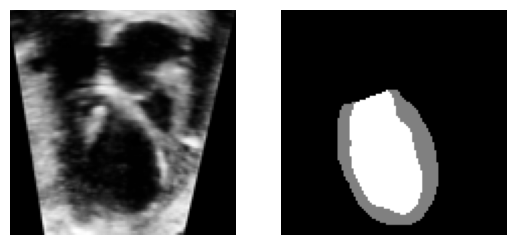

In [20]:
for data in valid_loader:
    x = data['train_img'].to(device, dtype=torch.float32)
    y = data['train_mask'].to(device, dtype=torch.float32)
    

    sliceno =40

    intensity = x[0,:,:,:,sliceno].cpu()
    slice = np.asarray(intensity.detach().numpy())
    slice = slice.reshape([112,112])
    intensity = slice

    y = voltosl(y,sliceno)
    
    fig, ax = plt.subplots(1,2)
    ax[0].imshow(intensity, cmap="gray")
    ax[0].axis("off")
    
    ax[1].imshow(y, cmap="gray")
    ax[1].axis("off")
    plt.show()
    break

In [21]:
optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience = 5, verbose= True)
#loss_fn = DiceBCELoss()
loss_fn = DiceCELoss()
#Rewrite for categorical cross entropy DICE

"""Training model """

/home/yiho/anaconda3/envs/pysegwst/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


'Training model '

In [22]:
if os.path.exists(path) is not True:
    os.mkdir(path) 
bestcheckpoint_path = path + "/bestcheckpoint.pth"
checkpoint_path = path + "/checkpoint.pth"

with open(path + "/params.txt", "w") as file1:
    # Writing data to a file
    file1.write("Num of epochs = " + str(NUM_EPOCHS) + "\n")
    file1.write("Cases trained = " + str(len(traincases))+ "\n")
    file1.write("Loss Used = " + str(loss_fn)+ "\n")
    file1.write("Features Used = " + str(features)+ "\n")
    file1.write("Learning Rate:" + str(LEARNING_RATE))

In [23]:
train_x = []
train_y = []
for c in traincases:
    train_x_dir = os.path.join(TRAIN_IMG_DIR[:-1], c)
    train_y_dir = os.path.join(TRAIN_MASK_DIR[:-1], c)
    
    train_x += sorted(glob(train_x_dir + "/*"))
    #print(train_x)
    #I think here it is loading all of the cases rather than one by one
    train_y += sorted(glob(train_y_dir + "/*"))
       
print(len(train_x))     
print(len(train_y))  

743
743


In [24]:
"""Dataset and loader"""
train_dataset = NiftiDataset(train_x,train_y)

train_loader = DataLoader(
    dataset=train_dataset,
    batch_size = BATCH_SIZE,
    shuffle = True,
    num_workers = NUM_WORKERS)

Current Epoch: 1 / 100


  0%|          | 0/186 [00:00<?, ?it/s]

100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


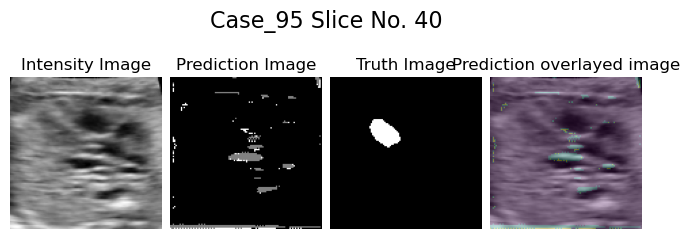

100%|██████████| 30/30 [00:04<00:00,  6.37it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


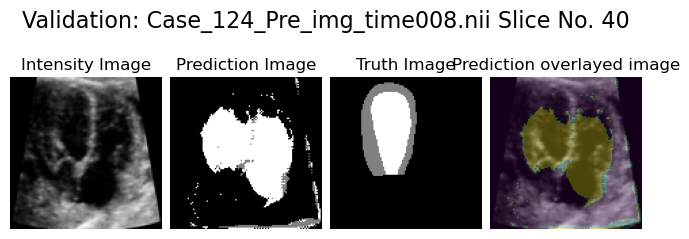

Valid loss improved from inf to 1.4103. Saving best checkpoint: /home/yiho/Haziq/3D 112 Dataset/testmodelsaves/HPCRunPlease/bestcheckpoint.pth
Epoch: 01 | Epoch Time: 1m 57s
	Train Loss: 1.521
	 Val. Loss: 1.410

Current Epoch: 2 / 100


100%|██████████| 186/186 [01:53<00:00,  1.64it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


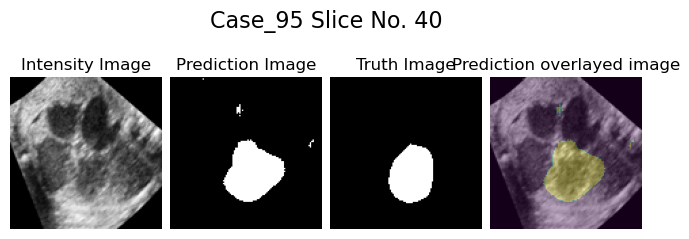

100%|██████████| 30/30 [00:04<00:00,  6.34it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


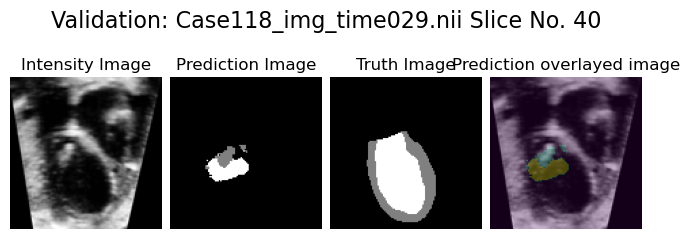

Epoch: 02 | Epoch Time: 1m 58s
	Train Loss: 0.855
	 Val. Loss: 1.602

Current Epoch: 3 / 100


100%|██████████| 186/186 [01:53<00:00,  1.64it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


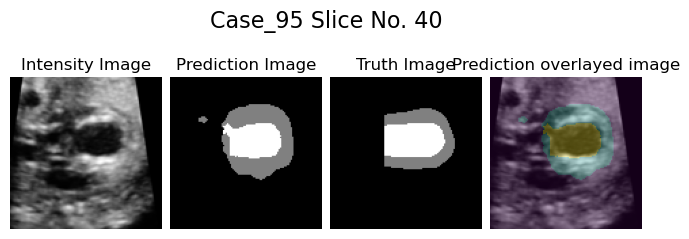

100%|██████████| 30/30 [00:04<00:00,  6.37it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


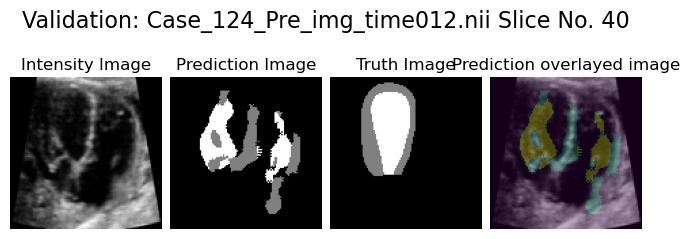

Valid loss improved from 1.4103 to 1.1457. Saving best checkpoint: /home/yiho/Haziq/3D 112 Dataset/testmodelsaves/HPCRunPlease/bestcheckpoint.pth
Epoch: 03 | Epoch Time: 1m 58s
	Train Loss: 0.655
	 Val. Loss: 1.146

Current Epoch: 4 / 100


100%|██████████| 186/186 [01:53<00:00,  1.64it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


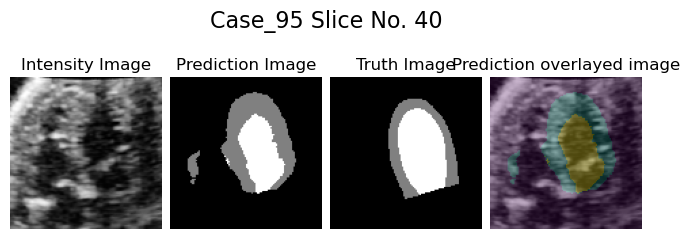

100%|██████████| 30/30 [00:04<00:00,  6.39it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


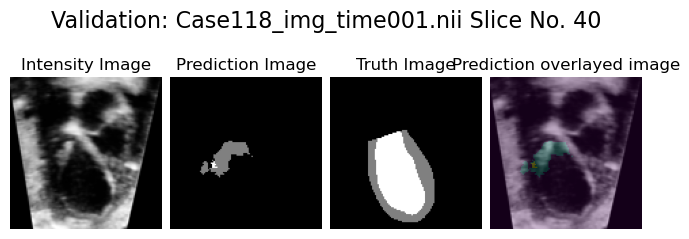

Epoch: 04 | Epoch Time: 1m 58s
	Train Loss: 0.508
	 Val. Loss: 1.564

Current Epoch: 5 / 100


100%|██████████| 186/186 [01:53<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


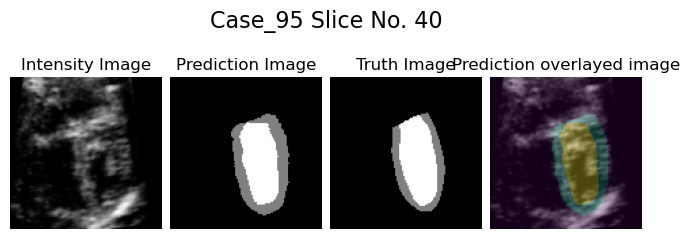

100%|██████████| 30/30 [00:04<00:00,  6.39it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


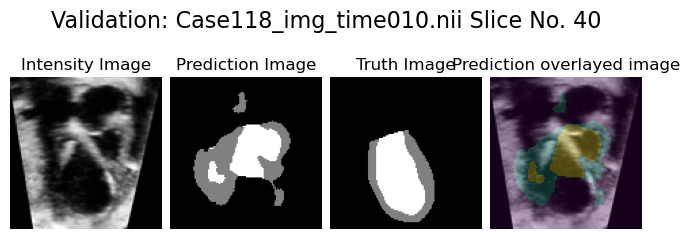

Valid loss improved from 1.1457 to 1.0460. Saving best checkpoint: /home/yiho/Haziq/3D 112 Dataset/testmodelsaves/HPCRunPlease/bestcheckpoint.pth
Epoch: 05 | Epoch Time: 1m 58s
	Train Loss: 0.368
	 Val. Loss: 1.046

Current Epoch: 6 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


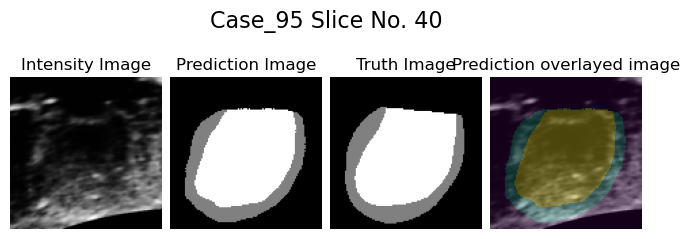

100%|██████████| 30/30 [00:04<00:00,  6.35it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


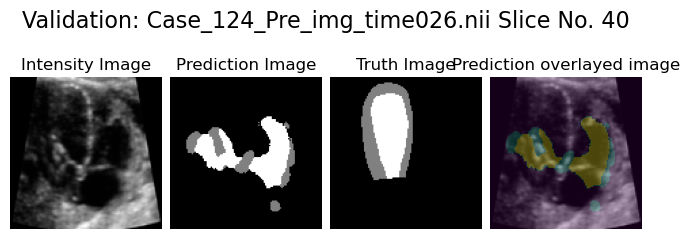

Valid loss improved from 1.0460 to 1.0120. Saving best checkpoint: /home/yiho/Haziq/3D 112 Dataset/testmodelsaves/HPCRunPlease/bestcheckpoint.pth
Epoch: 06 | Epoch Time: 1m 57s
	Train Loss: 0.334
	 Val. Loss: 1.012

Current Epoch: 7 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


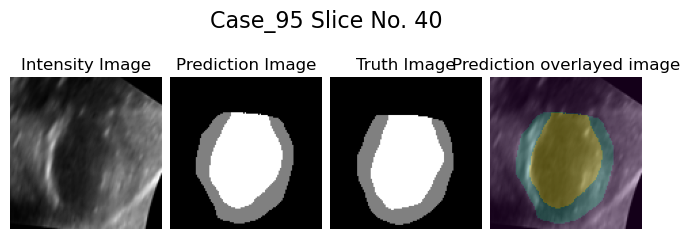

100%|██████████| 30/30 [00:04<00:00,  6.39it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


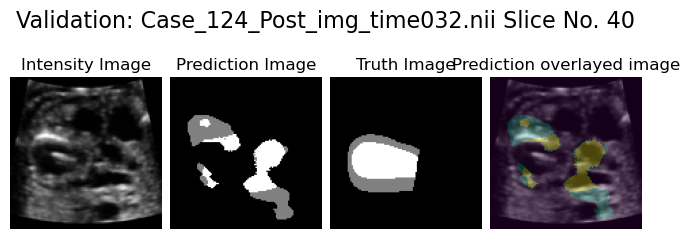

Valid loss improved from 1.0120 to 1.0089. Saving best checkpoint: /home/yiho/Haziq/3D 112 Dataset/testmodelsaves/HPCRunPlease/bestcheckpoint.pth
Epoch: 07 | Epoch Time: 1m 57s
	Train Loss: 0.277
	 Val. Loss: 1.009

Current Epoch: 8 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


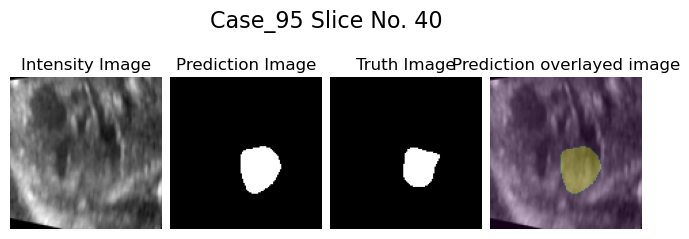

100%|██████████| 30/30 [00:04<00:00,  6.37it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


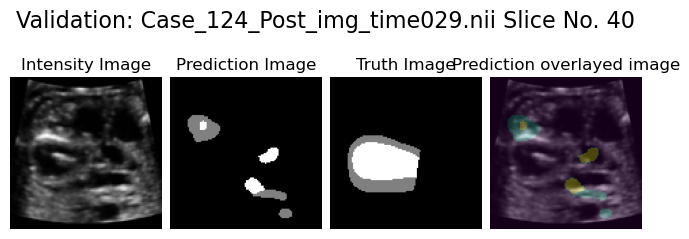

Epoch: 08 | Epoch Time: 1m 57s
	Train Loss: 0.273
	 Val. Loss: 1.147

Current Epoch: 9 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


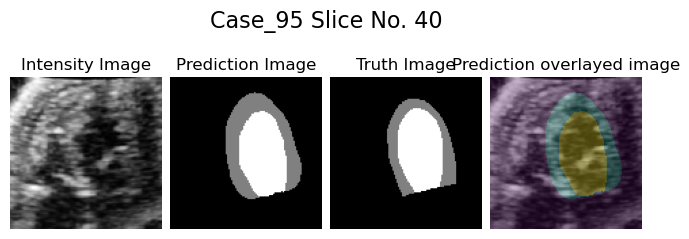

100%|██████████| 30/30 [00:04<00:00,  6.39it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


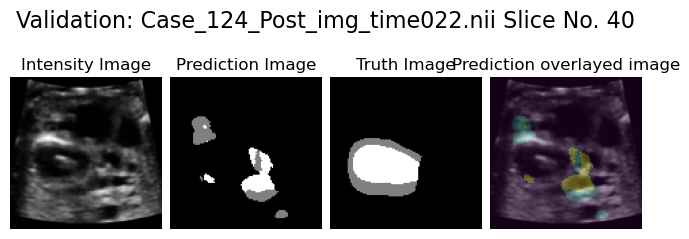

Epoch: 09 | Epoch Time: 1m 57s
	Train Loss: 0.273
	 Val. Loss: 1.029

Current Epoch: 10 / 100


100%|██████████| 186/186 [01:53<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


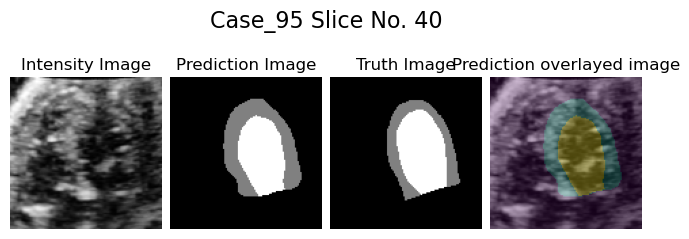

100%|██████████| 30/30 [00:04<00:00,  6.37it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


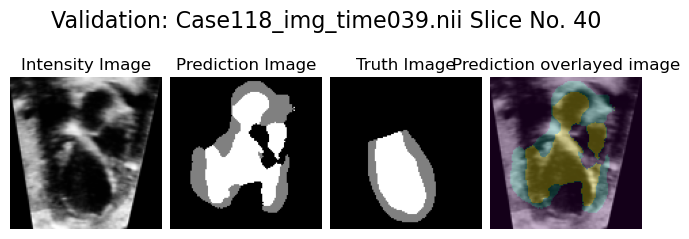

Valid loss improved from 1.0089 to 0.8308. Saving best checkpoint: /home/yiho/Haziq/3D 112 Dataset/testmodelsaves/HPCRunPlease/bestcheckpoint.pth
Epoch: 10 | Epoch Time: 1m 58s
	Train Loss: 0.234
	 Val. Loss: 0.831

Current Epoch: 11 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


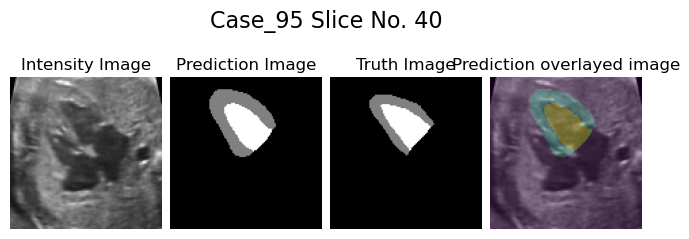

100%|██████████| 30/30 [00:04<00:00,  6.35it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


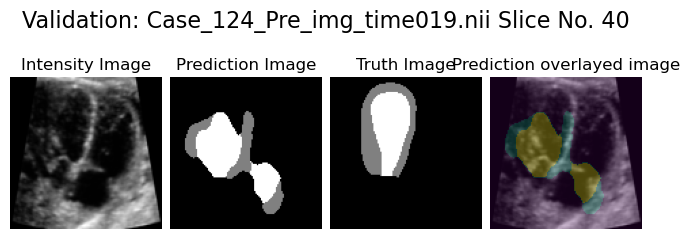

Epoch: 11 | Epoch Time: 1m 58s
	Train Loss: 0.221
	 Val. Loss: 0.878

Current Epoch: 12 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


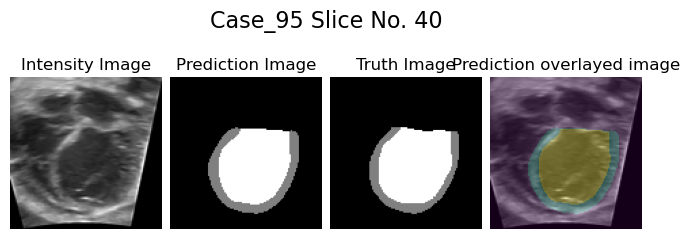

100%|██████████| 30/30 [00:04<00:00,  6.36it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


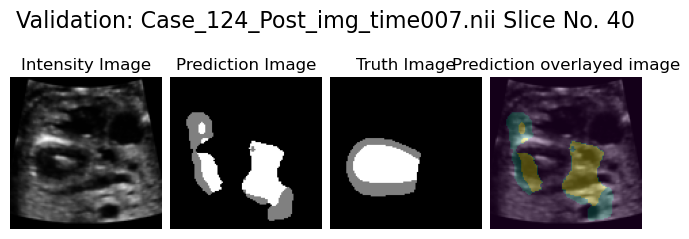

Epoch: 12 | Epoch Time: 1m 57s
	Train Loss: 0.229
	 Val. Loss: 0.923

Current Epoch: 13 / 100


100%|██████████| 186/186 [01:53<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


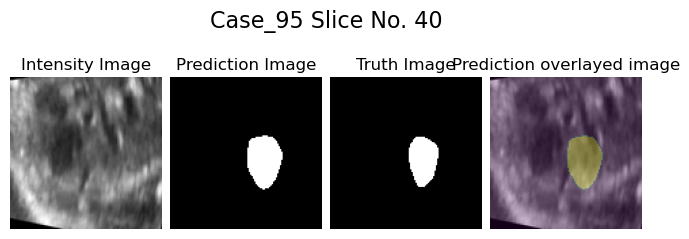

100%|██████████| 30/30 [00:04<00:00,  6.36it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


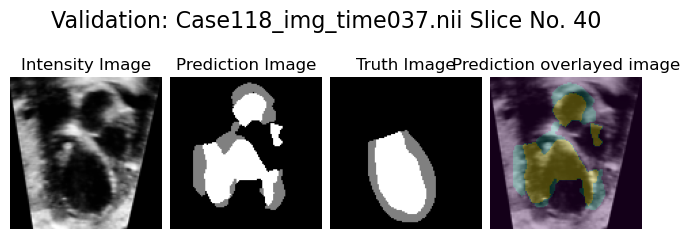

Epoch: 13 | Epoch Time: 1m 58s
	Train Loss: 0.218
	 Val. Loss: 0.870

Current Epoch: 14 / 100


100%|██████████| 186/186 [01:53<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


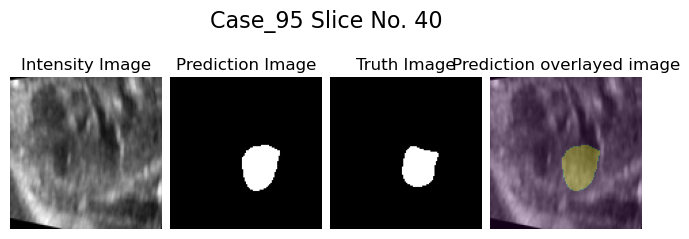

100%|██████████| 30/30 [00:04<00:00,  6.36it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


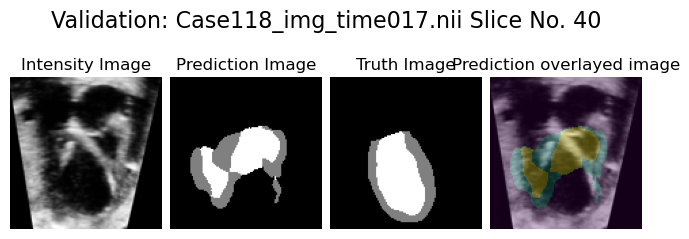

Epoch: 14 | Epoch Time: 1m 58s
	Train Loss: 0.213
	 Val. Loss: 1.042

Current Epoch: 15 / 100


100%|██████████| 186/186 [01:53<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


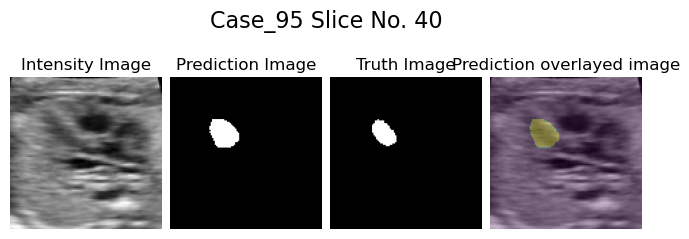

100%|██████████| 30/30 [00:04<00:00,  6.36it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


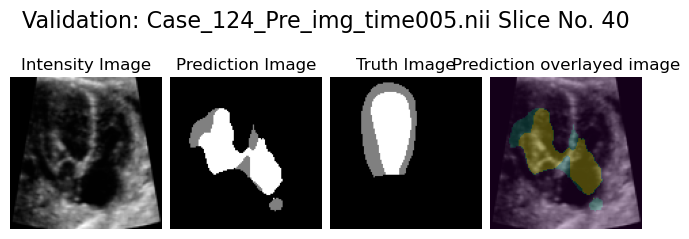

Epoch: 15 | Epoch Time: 1m 58s
	Train Loss: 0.187
	 Val. Loss: 0.888

Current Epoch: 16 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


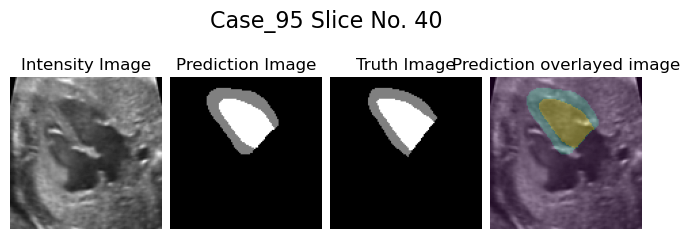

100%|██████████| 30/30 [00:04<00:00,  6.37it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


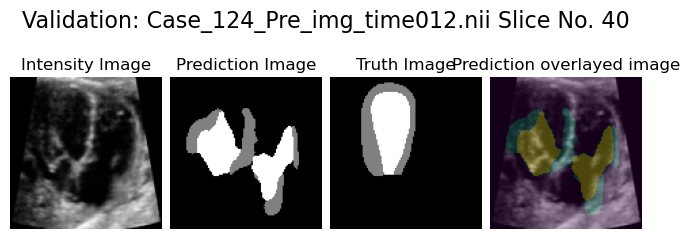

Epoch: 16 | Epoch Time: 1m 57s
	Train Loss: 0.181
	 Val. Loss: 0.846

Current Epoch: 17 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


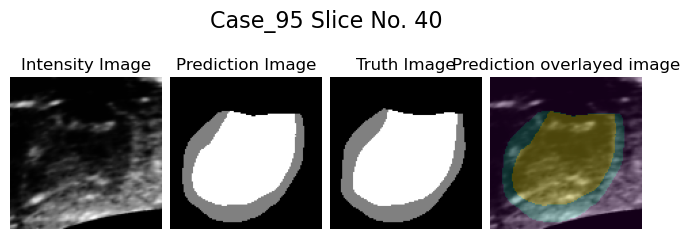

100%|██████████| 30/30 [00:04<00:00,  6.35it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


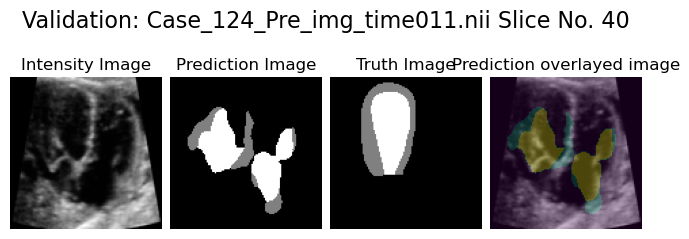

Epoch: 17 | Epoch Time: 1m 58s
	Train Loss: 0.179
	 Val. Loss: 0.890

Current Epoch: 18 / 100


100%|██████████| 186/186 [01:53<00:00,  1.64it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


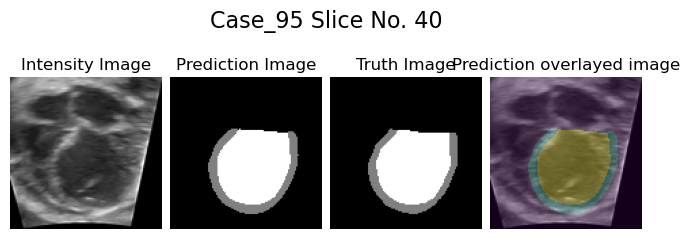

100%|██████████| 30/30 [00:04<00:00,  6.36it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


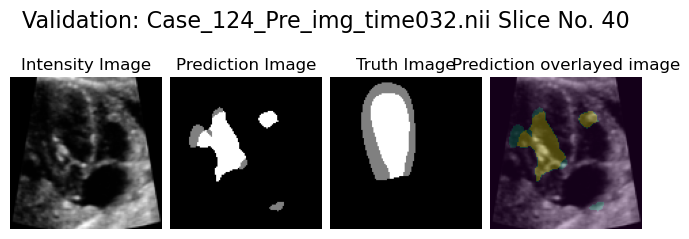

Epoch: 18 | Epoch Time: 1m 58s
	Train Loss: 0.165
	 Val. Loss: 0.949

Current Epoch: 19 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


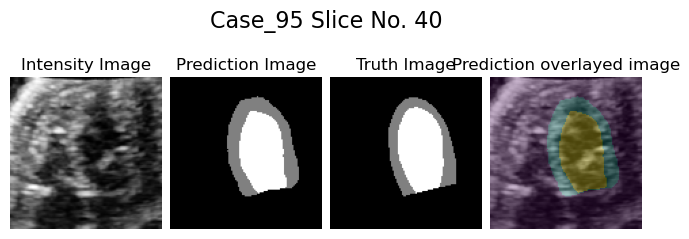

100%|██████████| 30/30 [00:04<00:00,  6.38it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


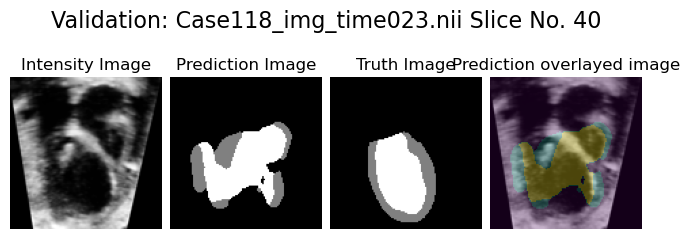

Epoch: 19 | Epoch Time: 1m 57s
	Train Loss: 0.152
	 Val. Loss: 0.929

Current Epoch: 20 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


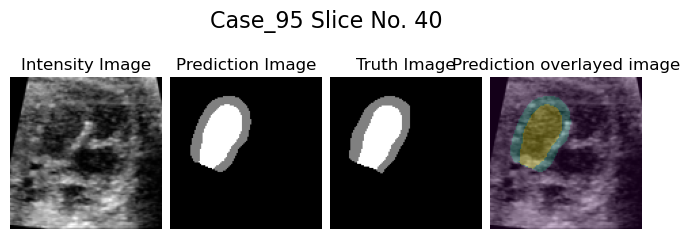

100%|██████████| 30/30 [00:04<00:00,  6.34it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


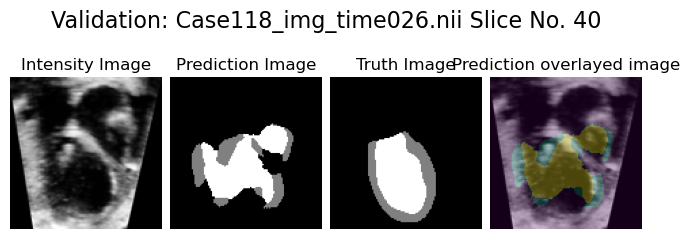

Epoch: 20 | Epoch Time: 1m 58s
	Train Loss: 0.188
	 Val. Loss: 0.914

Current Epoch: 21 / 100


100%|██████████| 186/186 [01:53<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


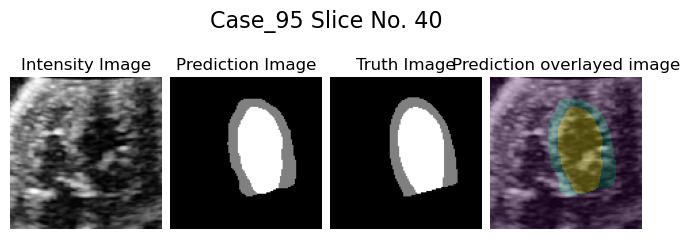

100%|██████████| 30/30 [00:04<00:00,  6.38it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


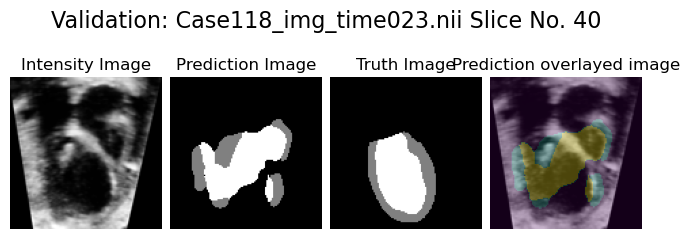

Epoch: 21 | Epoch Time: 1m 58s
	Train Loss: 0.185
	 Val. Loss: 0.894

Current Epoch: 22 / 100


100%|██████████| 186/186 [01:53<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


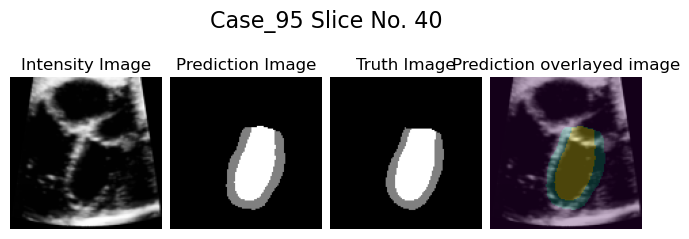

100%|██████████| 30/30 [00:04<00:00,  6.38it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


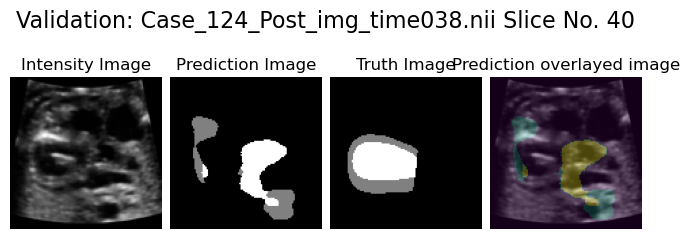

Epoch: 22 | Epoch Time: 1m 58s
	Train Loss: 0.177
	 Val. Loss: 0.915

Current Epoch: 23 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


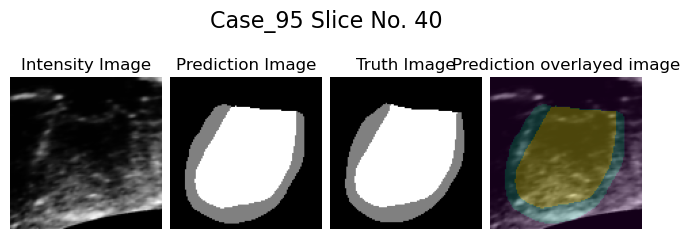

100%|██████████| 30/30 [00:04<00:00,  6.37it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


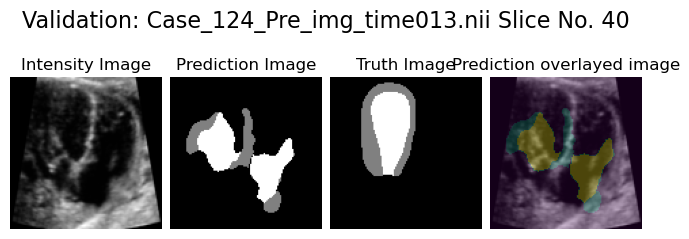

Epoch: 23 | Epoch Time: 1m 57s
	Train Loss: 0.158
	 Val. Loss: 0.922

Current Epoch: 24 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


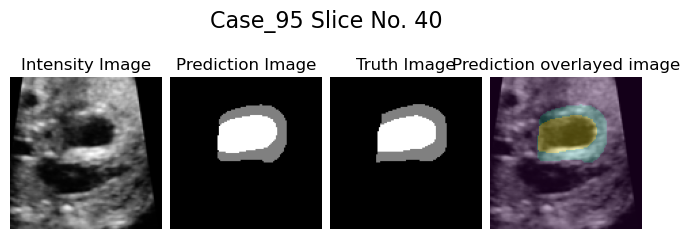

100%|██████████| 30/30 [00:04<00:00,  6.37it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


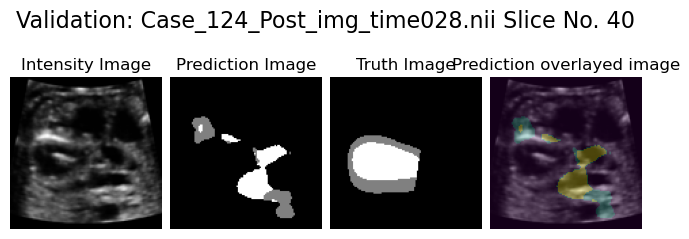

Epoch: 24 | Epoch Time: 1m 57s
	Train Loss: 0.168
	 Val. Loss: 0.925

Current Epoch: 25 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


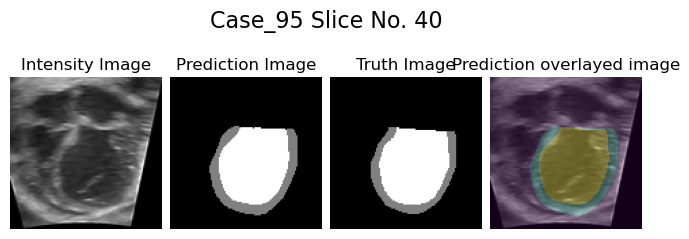

100%|██████████| 30/30 [00:04<00:00,  6.37it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


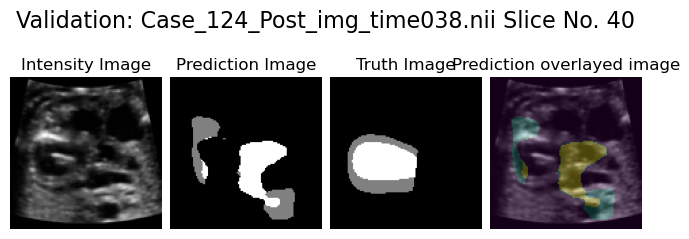

Epoch: 25 | Epoch Time: 1m 57s
	Train Loss: 0.190
	 Val. Loss: 0.894

Current Epoch: 26 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


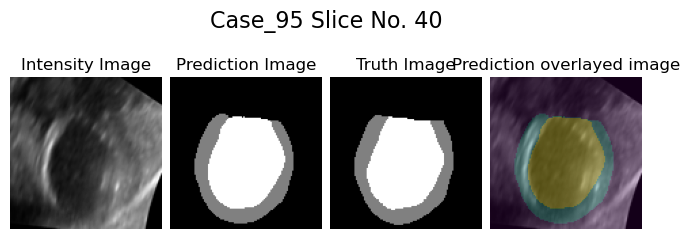

100%|██████████| 30/30 [00:04<00:00,  6.39it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


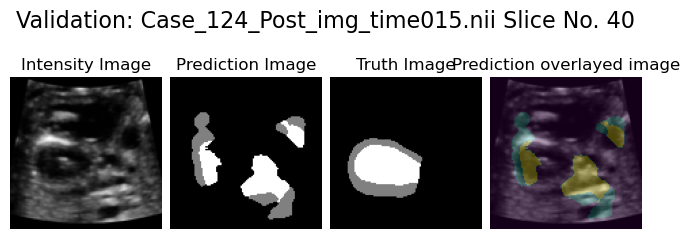

Epoch: 26 | Epoch Time: 1m 57s
	Train Loss: 0.189
	 Val. Loss: 0.910

Current Epoch: 27 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


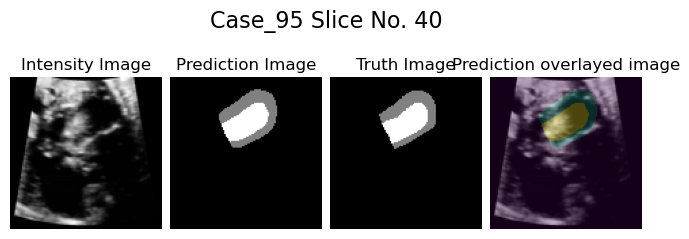

100%|██████████| 30/30 [00:04<00:00,  6.39it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


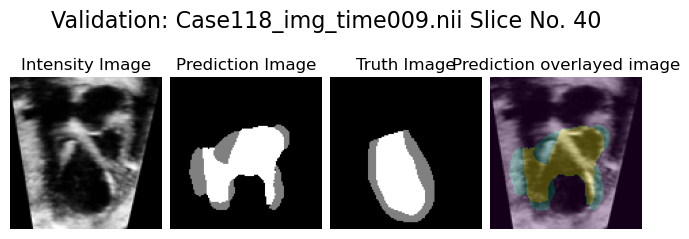

Epoch: 27 | Epoch Time: 1m 57s
	Train Loss: 0.135
	 Val. Loss: 0.920

Current Epoch: 28 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


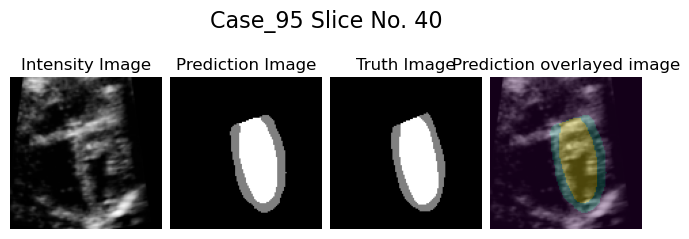

100%|██████████| 30/30 [00:04<00:00,  6.38it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


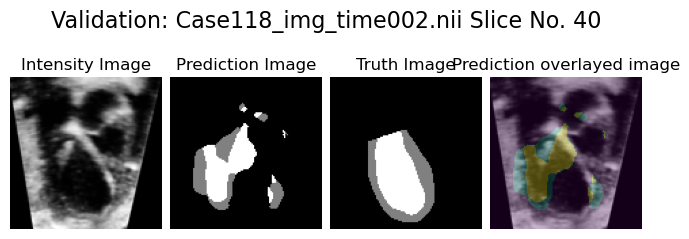

Epoch: 28 | Epoch Time: 1m 57s
	Train Loss: 0.125
	 Val. Loss: 0.908

Current Epoch: 29 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


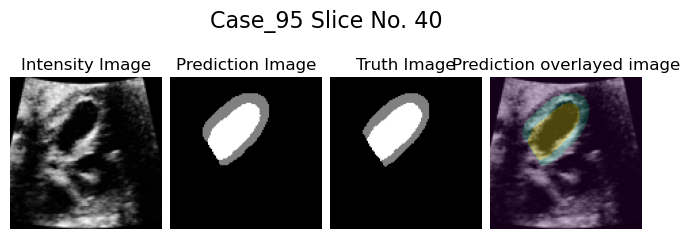

100%|██████████| 30/30 [00:04<00:00,  6.39it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


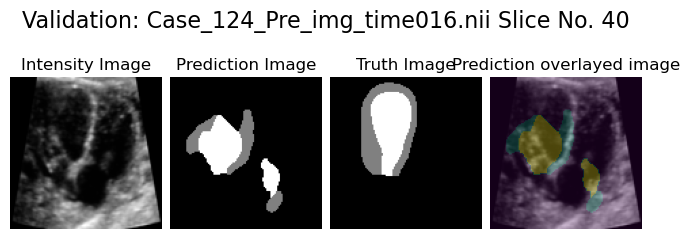

Epoch: 29 | Epoch Time: 1m 57s
	Train Loss: 0.147
	 Val. Loss: 0.918

Current Epoch: 30 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


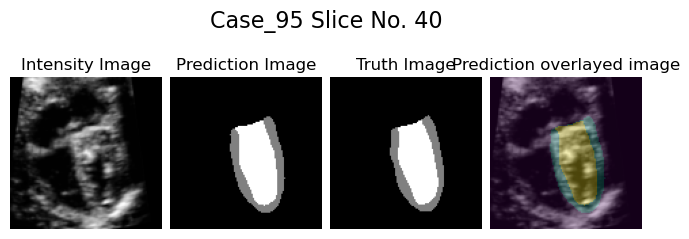

100%|██████████| 30/30 [00:04<00:00,  6.40it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


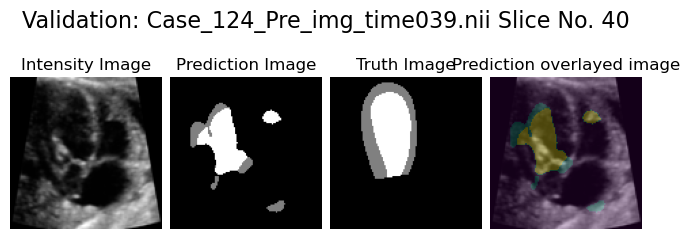

Epoch: 30 | Epoch Time: 1m 57s
	Train Loss: 0.181
	 Val. Loss: 0.918

Current Epoch: 31 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


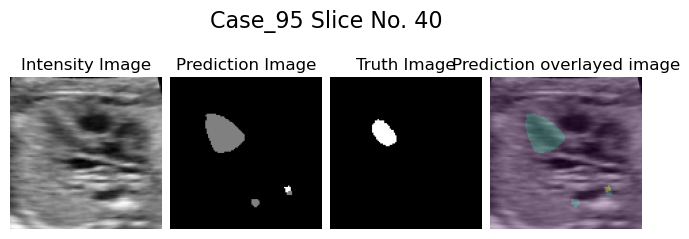

100%|██████████| 30/30 [00:04<00:00,  6.40it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


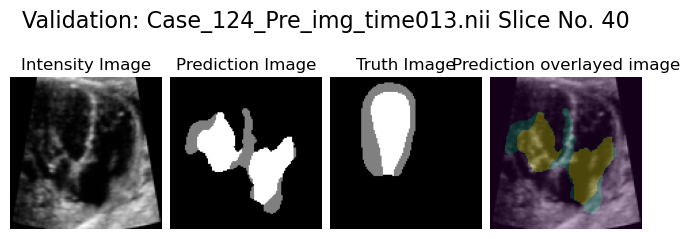

Epoch: 31 | Epoch Time: 1m 57s
	Train Loss: 0.147
	 Val. Loss: 0.883

Current Epoch: 32 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


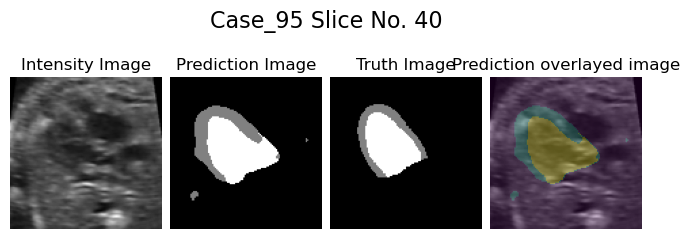

100%|██████████| 30/30 [00:04<00:00,  6.36it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


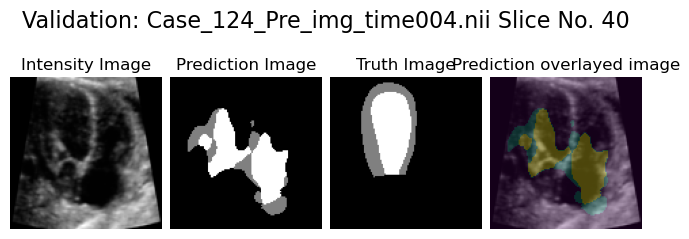

Epoch: 32 | Epoch Time: 1m 57s
	Train Loss: 0.150
	 Val. Loss: 0.877

Current Epoch: 33 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


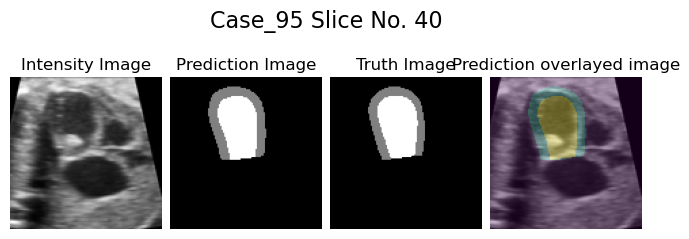

100%|██████████| 30/30 [00:04<00:00,  6.38it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


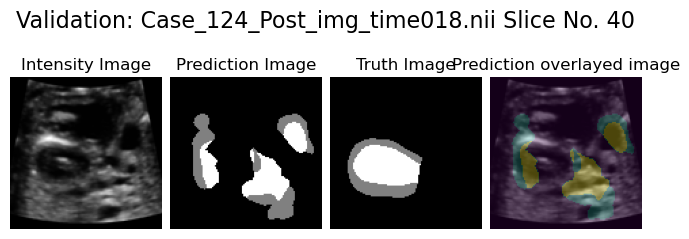

Epoch: 33 | Epoch Time: 1m 57s
	Train Loss: 0.164
	 Val. Loss: 0.903

Current Epoch: 34 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


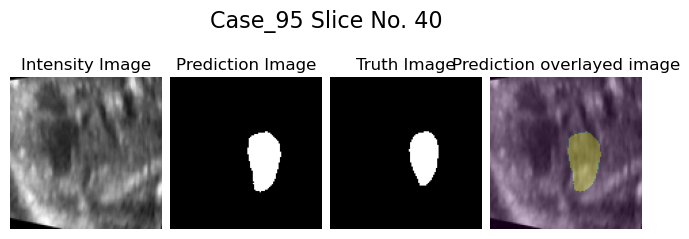

100%|██████████| 30/30 [00:04<00:00,  6.37it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


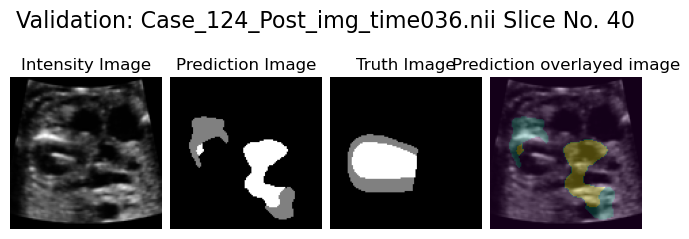

Epoch: 34 | Epoch Time: 1m 57s
	Train Loss: 0.159
	 Val. Loss: 0.910

Current Epoch: 35 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


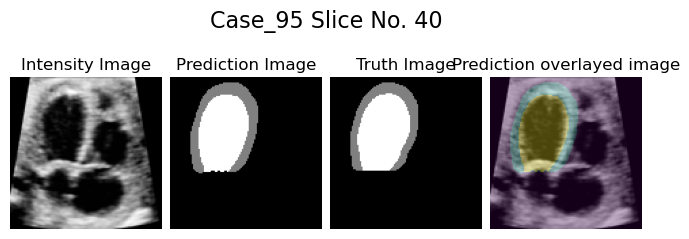

100%|██████████| 30/30 [00:04<00:00,  6.37it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


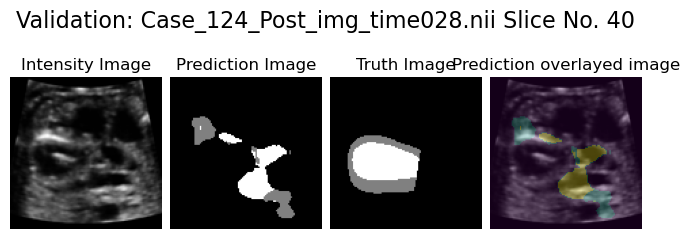

Epoch: 35 | Epoch Time: 1m 57s
	Train Loss: 0.180
	 Val. Loss: 0.908

Current Epoch: 36 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


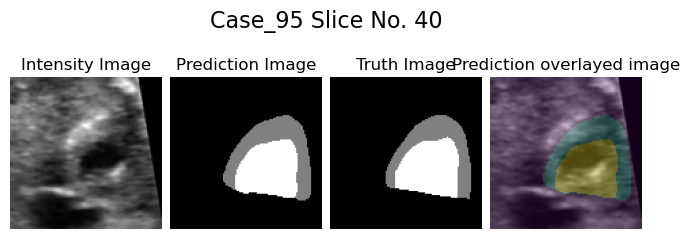

100%|██████████| 30/30 [00:04<00:00,  6.37it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


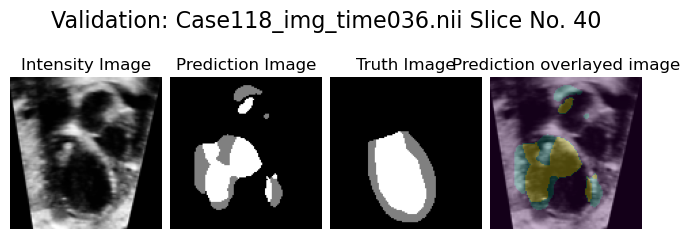

Epoch: 36 | Epoch Time: 1m 57s
	Train Loss: 0.168
	 Val. Loss: 0.887

Current Epoch: 37 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


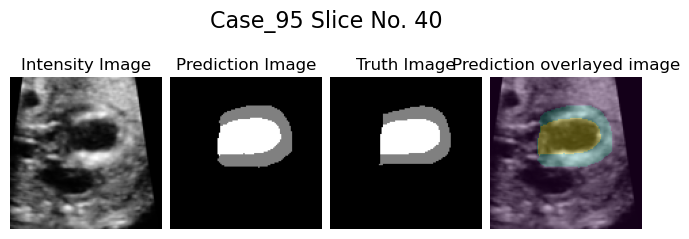

100%|██████████| 30/30 [00:04<00:00,  6.36it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


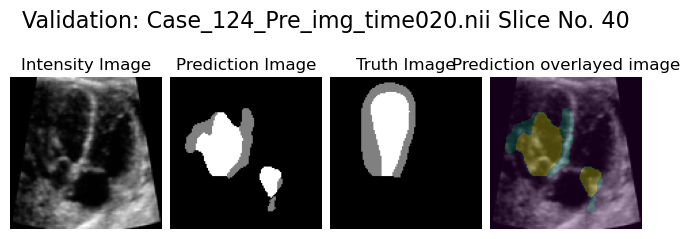

Epoch: 37 | Epoch Time: 1m 57s
	Train Loss: 0.158
	 Val. Loss: 0.889

Current Epoch: 38 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


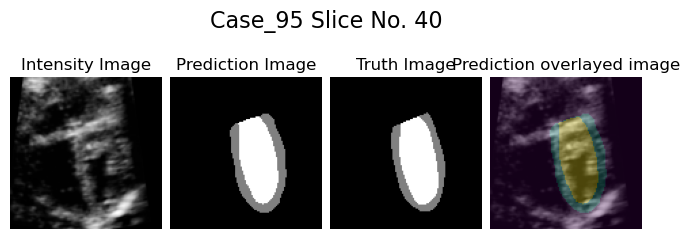

100%|██████████| 30/30 [00:04<00:00,  6.38it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


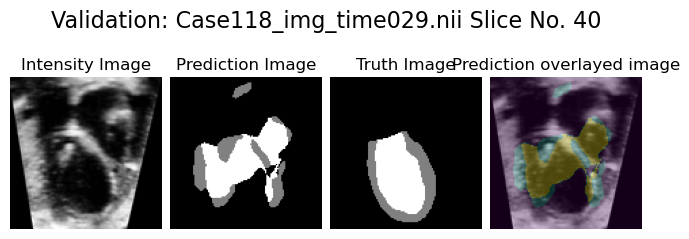

Epoch: 38 | Epoch Time: 1m 57s
	Train Loss: 0.171
	 Val. Loss: 0.886

Current Epoch: 39 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


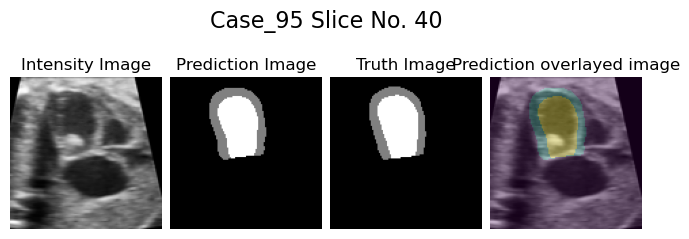

100%|██████████| 30/30 [00:04<00:00,  6.38it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


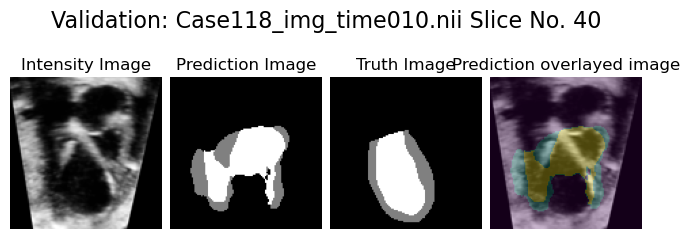

Epoch: 39 | Epoch Time: 1m 57s
	Train Loss: 0.150
	 Val. Loss: 0.907

Current Epoch: 40 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


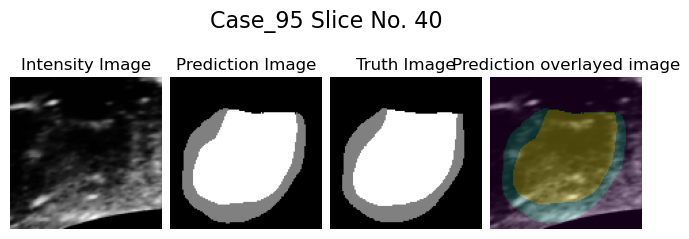

100%|██████████| 30/30 [00:04<00:00,  6.38it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


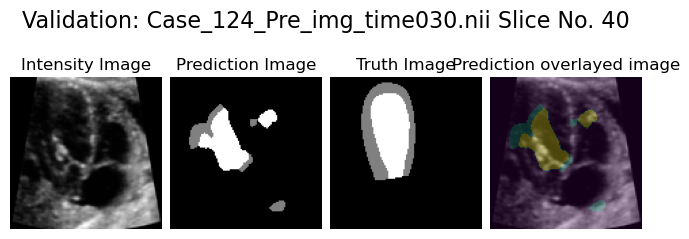

Epoch: 40 | Epoch Time: 1m 57s
	Train Loss: 0.174
	 Val. Loss: 0.923

Current Epoch: 41 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


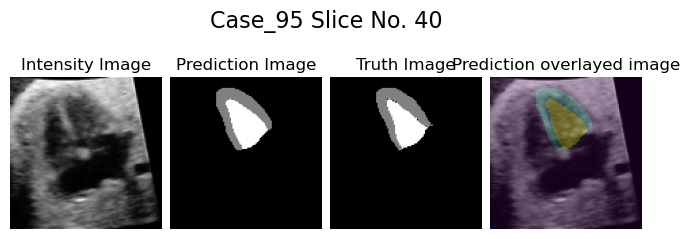

100%|██████████| 30/30 [00:04<00:00,  6.36it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


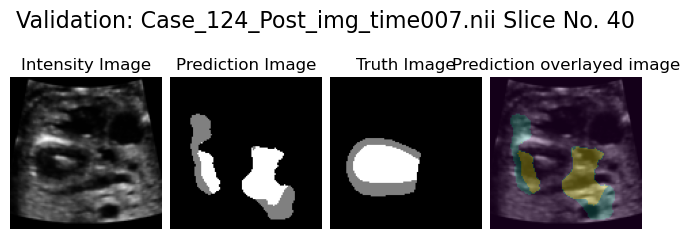

Epoch: 41 | Epoch Time: 1m 57s
	Train Loss: 0.172
	 Val. Loss: 0.927

Current Epoch: 42 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


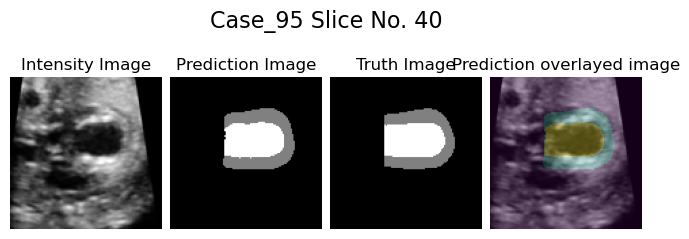

100%|██████████| 30/30 [00:04<00:00,  6.37it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


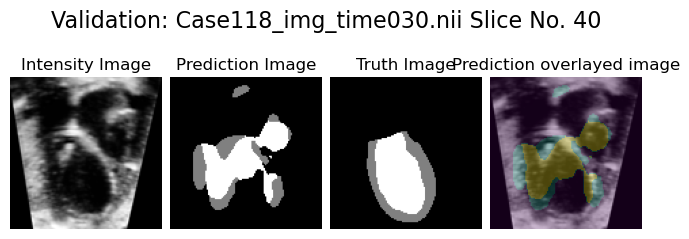

Epoch: 42 | Epoch Time: 1m 57s
	Train Loss: 0.140
	 Val. Loss: 0.883

Current Epoch: 43 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


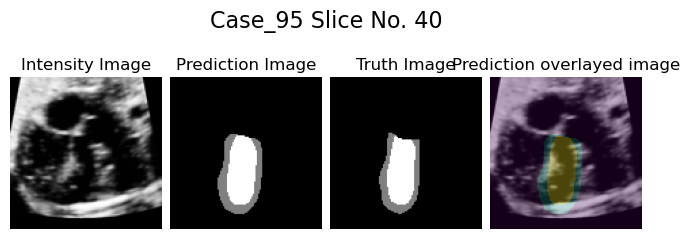

100%|██████████| 30/30 [00:04<00:00,  6.31it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


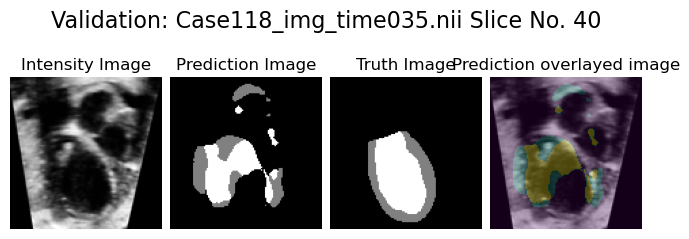

Epoch: 43 | Epoch Time: 1m 57s
	Train Loss: 0.170
	 Val. Loss: 0.893

Current Epoch: 44 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


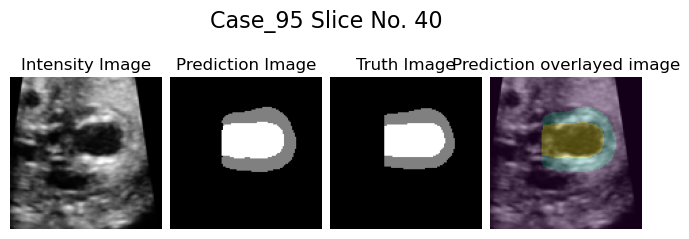

100%|██████████| 30/30 [00:04<00:00,  6.37it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


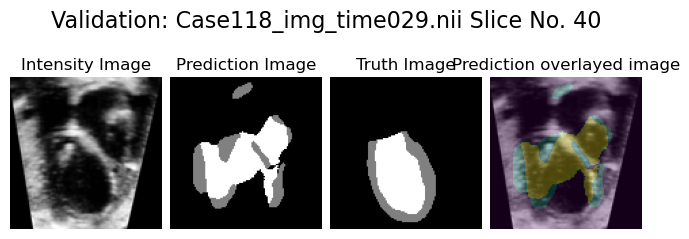

Epoch: 44 | Epoch Time: 1m 57s
	Train Loss: 0.150
	 Val. Loss: 0.885

Current Epoch: 45 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


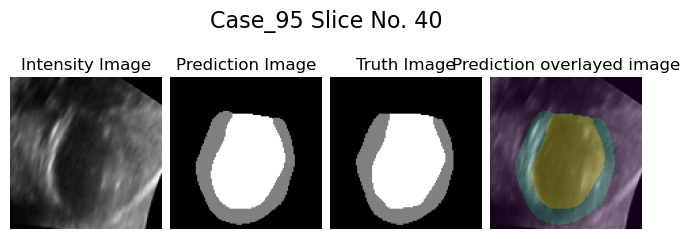

100%|██████████| 30/30 [00:04<00:00,  6.36it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


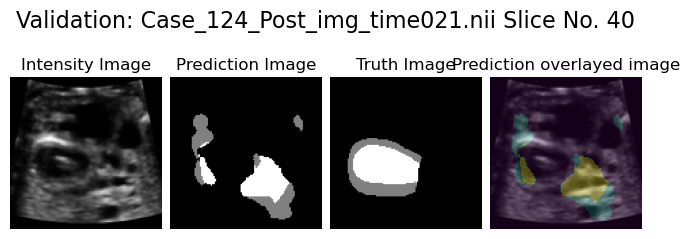

Epoch: 45 | Epoch Time: 1m 57s
	Train Loss: 0.129
	 Val. Loss: 0.912

Current Epoch: 46 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


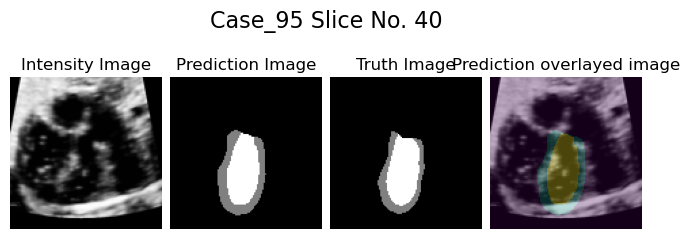

100%|██████████| 30/30 [00:04<00:00,  6.39it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


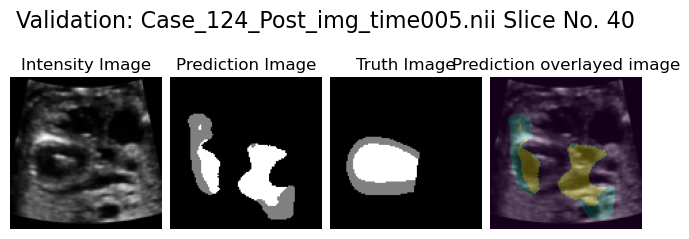

Epoch: 46 | Epoch Time: 1m 57s
	Train Loss: 0.180
	 Val. Loss: 0.887

Current Epoch: 47 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


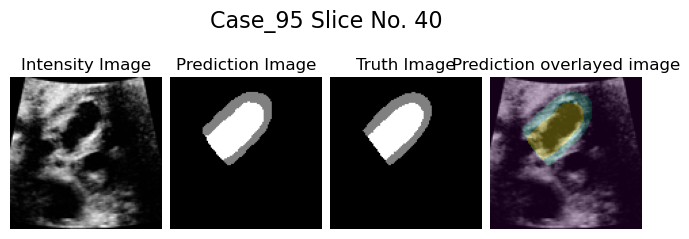

100%|██████████| 30/30 [00:04<00:00,  6.37it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


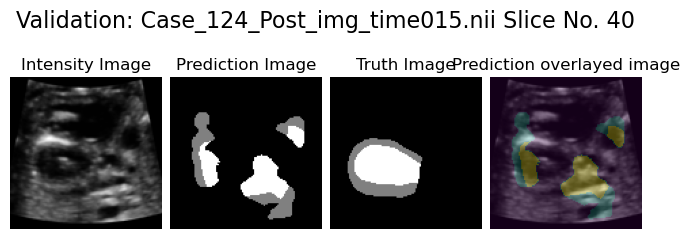

Epoch: 47 | Epoch Time: 1m 57s
	Train Loss: 0.184
	 Val. Loss: 0.925

Current Epoch: 48 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


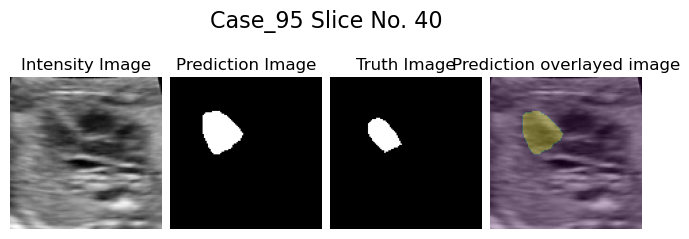

100%|██████████| 30/30 [00:04<00:00,  6.36it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


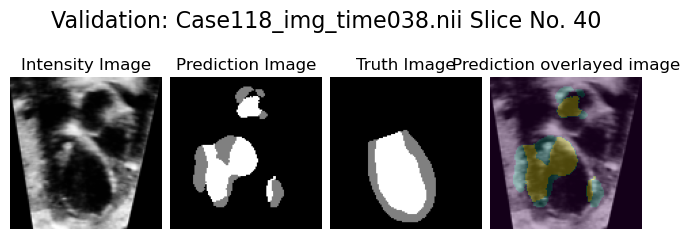

Epoch: 48 | Epoch Time: 1m 57s
	Train Loss: 0.139
	 Val. Loss: 0.896

Current Epoch: 49 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


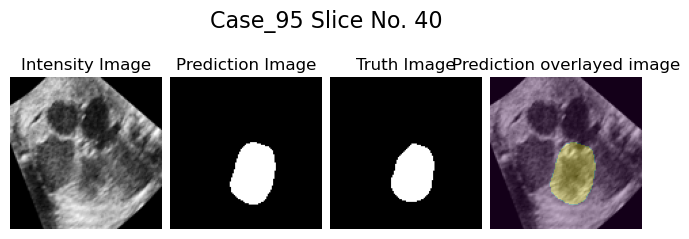

100%|██████████| 30/30 [00:04<00:00,  6.39it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


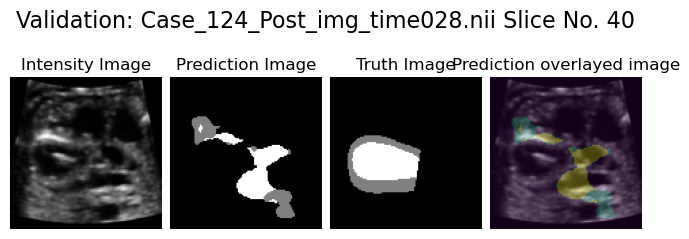

Epoch: 49 | Epoch Time: 1m 57s
	Train Loss: 0.178
	 Val. Loss: 0.900

Current Epoch: 50 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


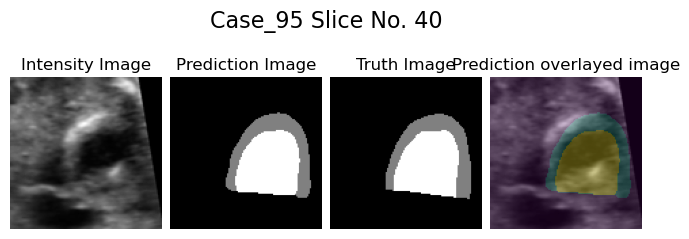

100%|██████████| 30/30 [00:04<00:00,  6.40it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


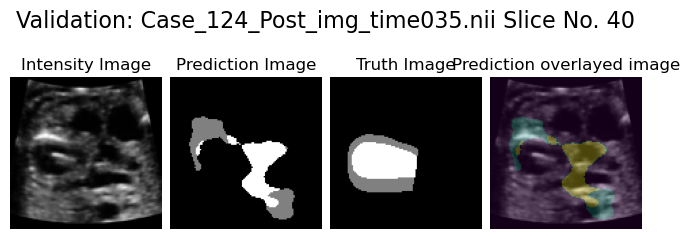

Epoch: 50 | Epoch Time: 1m 57s
	Train Loss: 0.153
	 Val. Loss: 0.910

Current Epoch: 51 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


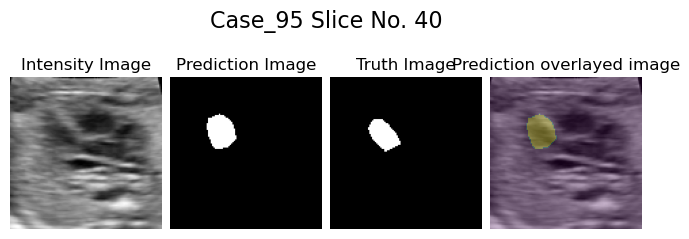

100%|██████████| 30/30 [00:04<00:00,  6.40it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


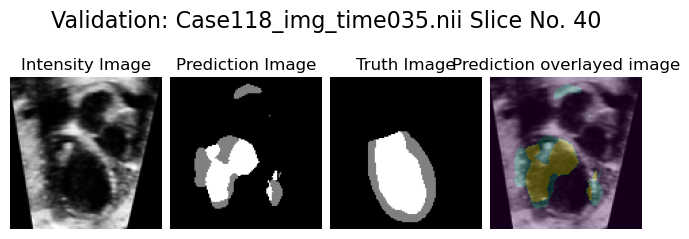

Epoch: 51 | Epoch Time: 1m 57s
	Train Loss: 0.146
	 Val. Loss: 0.931

Current Epoch: 52 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


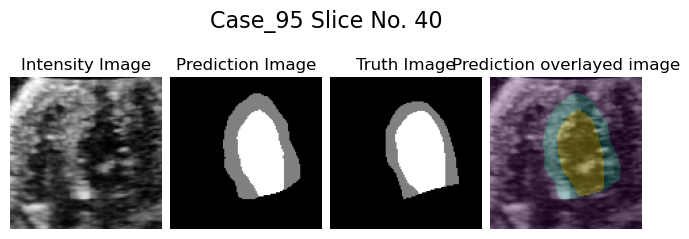

100%|██████████| 30/30 [00:04<00:00,  6.37it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


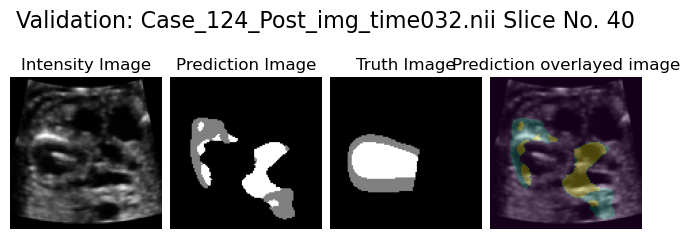

Epoch: 52 | Epoch Time: 1m 57s
	Train Loss: 0.155
	 Val. Loss: 0.895

Current Epoch: 53 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


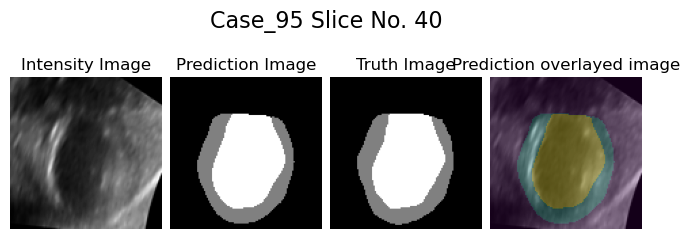

100%|██████████| 30/30 [00:04<00:00,  6.33it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


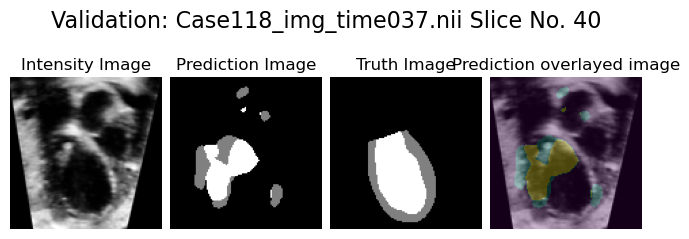

Epoch: 53 | Epoch Time: 1m 57s
	Train Loss: 0.162
	 Val. Loss: 0.926

Current Epoch: 54 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


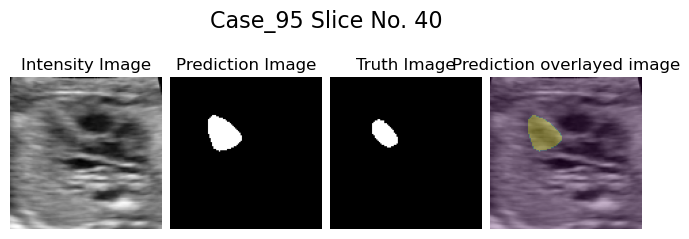

100%|██████████| 30/30 [00:04<00:00,  6.40it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


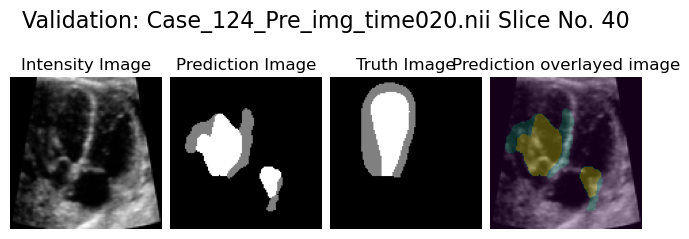

Epoch: 54 | Epoch Time: 1m 57s
	Train Loss: 0.163
	 Val. Loss: 0.913

Current Epoch: 55 / 100


100%|██████████| 186/186 [01:53<00:00,  1.64it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


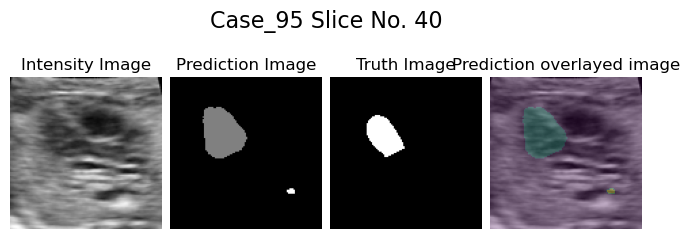

100%|██████████| 30/30 [00:04<00:00,  6.38it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


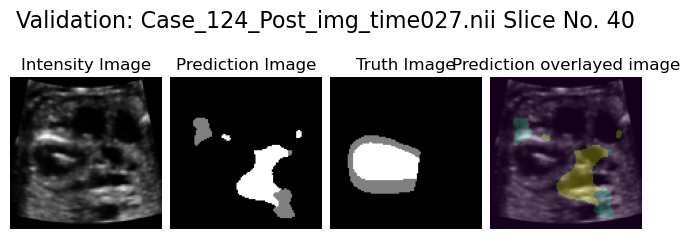

Epoch: 55 | Epoch Time: 1m 58s
	Train Loss: 0.180
	 Val. Loss: 0.906

Current Epoch: 56 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


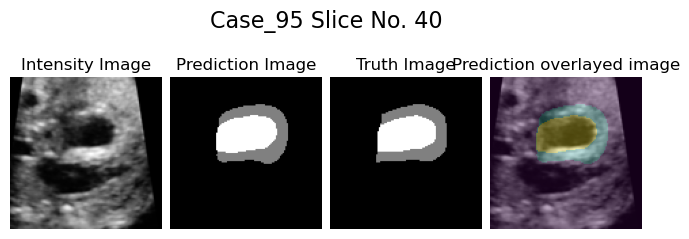

100%|██████████| 30/30 [00:04<00:00,  6.40it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


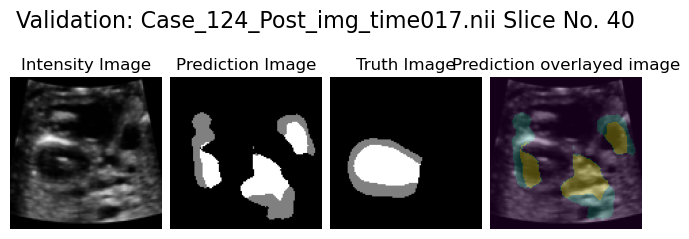

Epoch: 56 | Epoch Time: 1m 57s
	Train Loss: 0.173
	 Val. Loss: 0.895

Current Epoch: 57 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


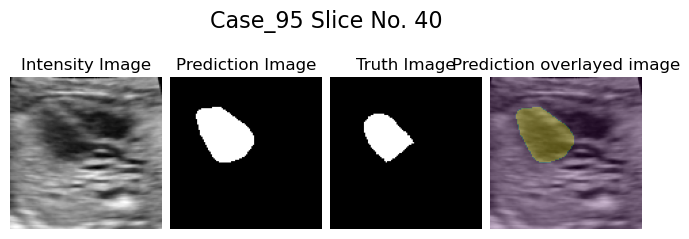

100%|██████████| 30/30 [00:04<00:00,  6.32it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


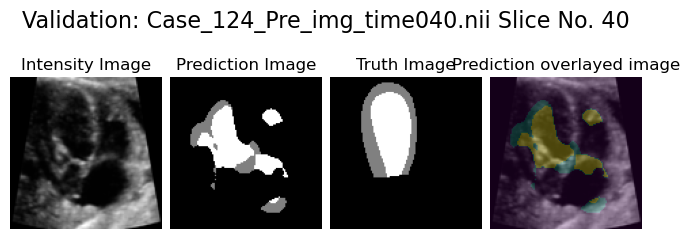

Epoch: 57 | Epoch Time: 1m 57s
	Train Loss: 0.157
	 Val. Loss: 0.901

Current Epoch: 58 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


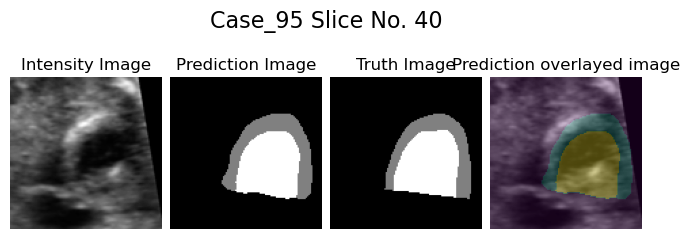

100%|██████████| 30/30 [00:04<00:00,  6.37it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


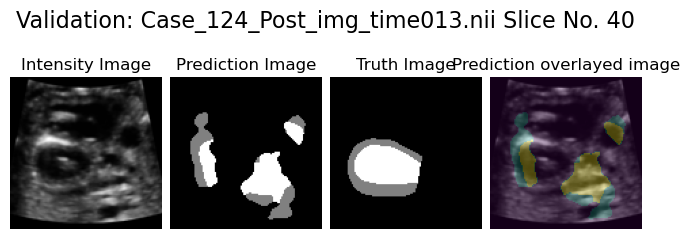

Epoch: 58 | Epoch Time: 1m 57s
	Train Loss: 0.189
	 Val. Loss: 0.915

Current Epoch: 59 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


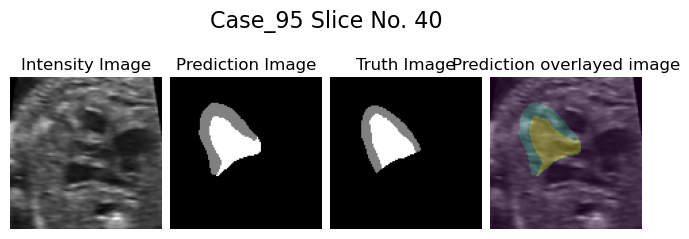

100%|██████████| 30/30 [00:04<00:00,  6.39it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


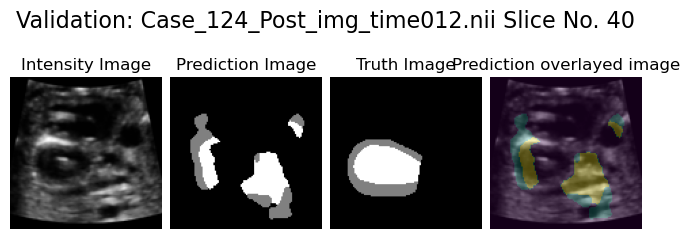

Epoch: 59 | Epoch Time: 1m 57s
	Train Loss: 0.151
	 Val. Loss: 0.908

Current Epoch: 60 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


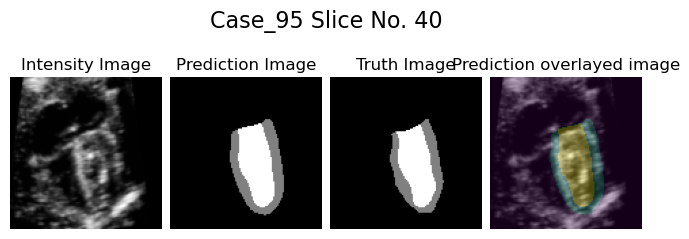

100%|██████████| 30/30 [00:04<00:00,  6.39it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


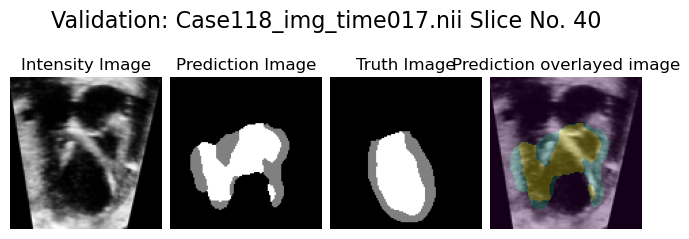

Epoch: 60 | Epoch Time: 1m 57s
	Train Loss: 0.140
	 Val. Loss: 0.910

Current Epoch: 61 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


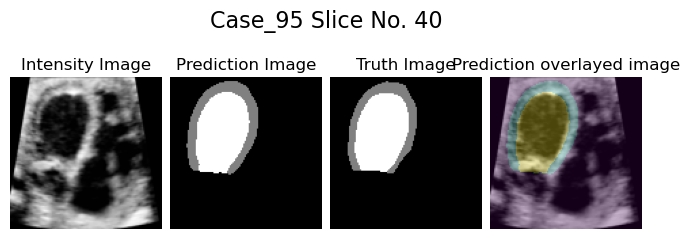

100%|██████████| 30/30 [00:04<00:00,  6.38it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


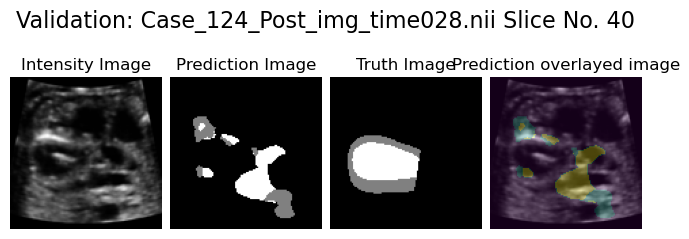

Epoch: 61 | Epoch Time: 1m 57s
	Train Loss: 0.192
	 Val. Loss: 0.901

Current Epoch: 62 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


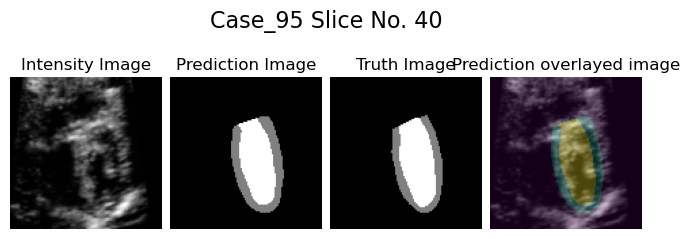

100%|██████████| 30/30 [00:04<00:00,  6.39it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


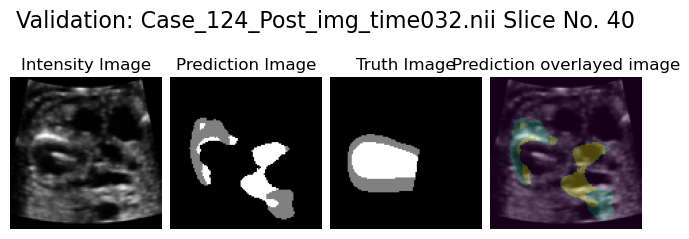

Epoch: 62 | Epoch Time: 1m 57s
	Train Loss: 0.160
	 Val. Loss: 0.890

Current Epoch: 63 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


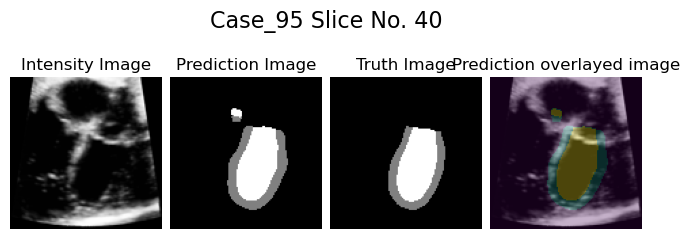

100%|██████████| 30/30 [00:04<00:00,  6.38it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


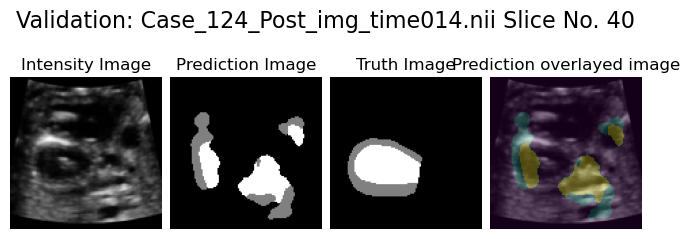

Epoch: 63 | Epoch Time: 1m 57s
	Train Loss: 0.190
	 Val. Loss: 0.912

Current Epoch: 64 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


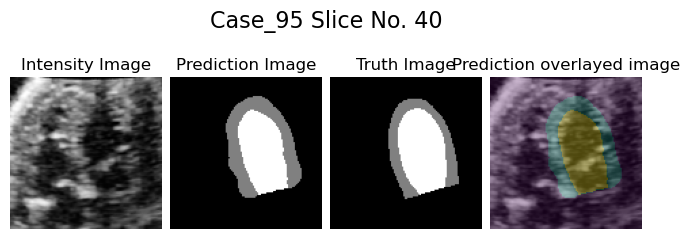

100%|██████████| 30/30 [00:04<00:00,  6.36it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


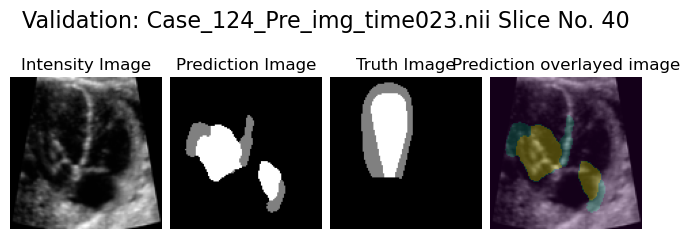

Epoch: 64 | Epoch Time: 1m 57s
	Train Loss: 0.165
	 Val. Loss: 0.891

Current Epoch: 65 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


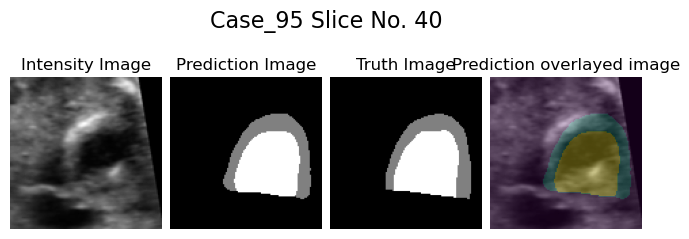

100%|██████████| 30/30 [00:04<00:00,  6.35it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


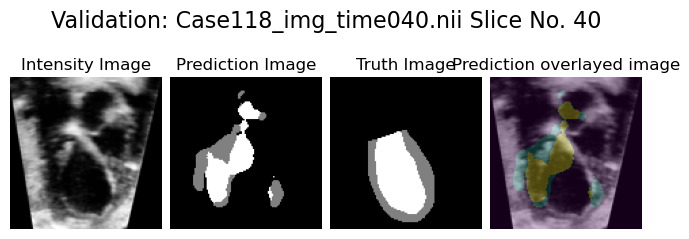

Epoch: 65 | Epoch Time: 1m 57s
	Train Loss: 0.163
	 Val. Loss: 0.894

Current Epoch: 66 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


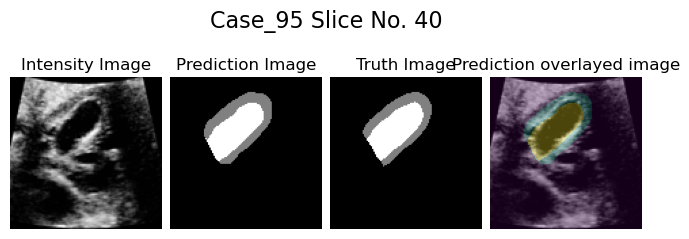

100%|██████████| 30/30 [00:04<00:00,  6.38it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


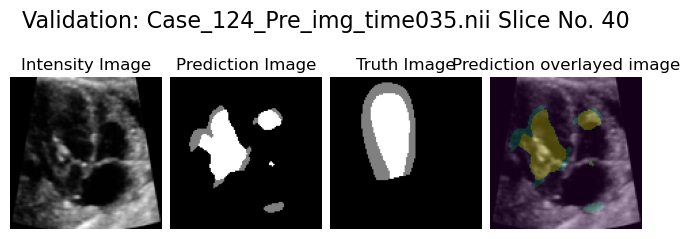

Epoch: 66 | Epoch Time: 1m 57s
	Train Loss: 0.172
	 Val. Loss: 0.907

Current Epoch: 67 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


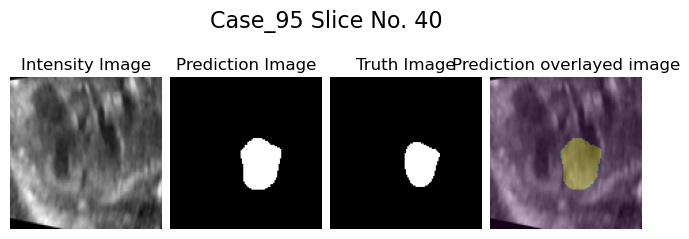

100%|██████████| 30/30 [00:04<00:00,  6.39it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


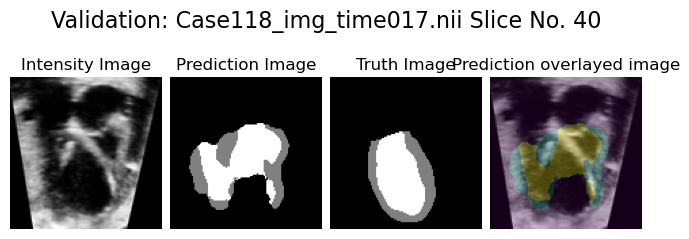

Epoch: 67 | Epoch Time: 1m 57s
	Train Loss: 0.162
	 Val. Loss: 0.893

Current Epoch: 68 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


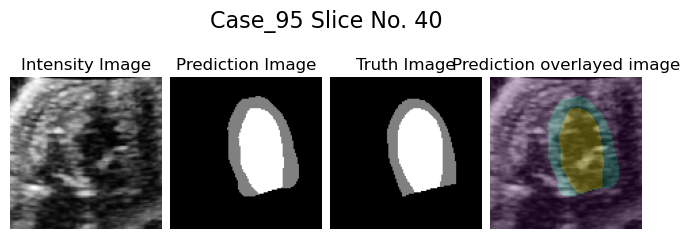

100%|██████████| 30/30 [00:04<00:00,  6.39it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


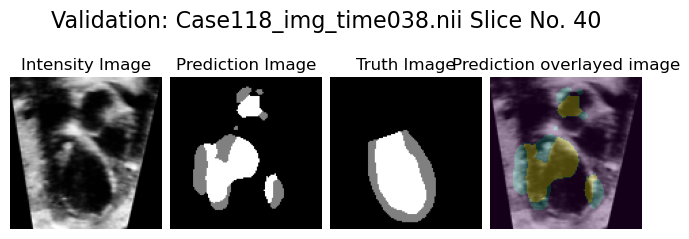

Epoch: 68 | Epoch Time: 1m 57s
	Train Loss: 0.159
	 Val. Loss: 0.907

Current Epoch: 69 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


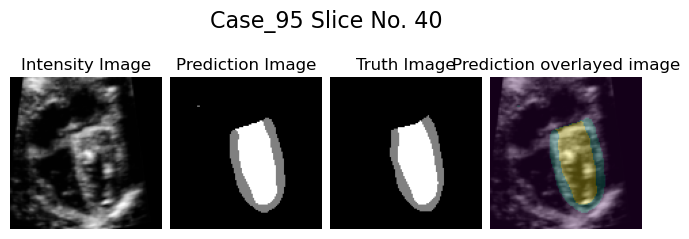

100%|██████████| 30/30 [00:04<00:00,  6.39it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


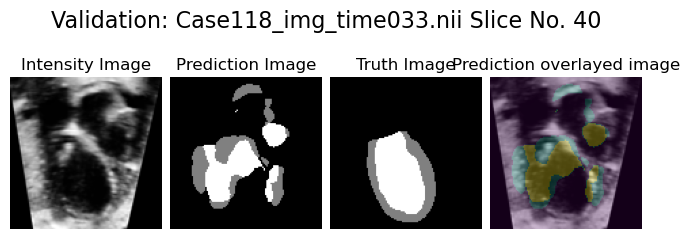

Epoch: 69 | Epoch Time: 1m 57s
	Train Loss: 0.173
	 Val. Loss: 0.915

Current Epoch: 70 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


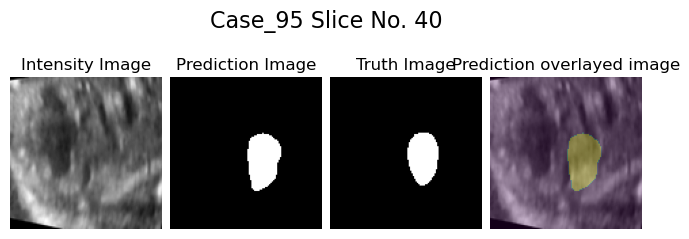

100%|██████████| 30/30 [00:04<00:00,  6.40it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


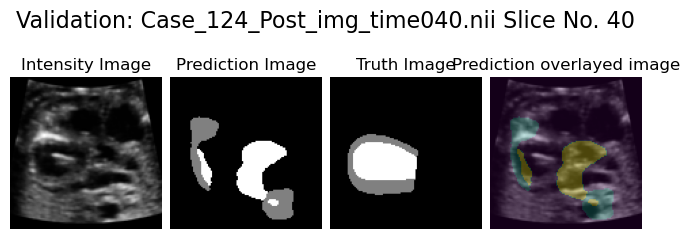

Epoch: 70 | Epoch Time: 1m 57s
	Train Loss: 0.142
	 Val. Loss: 0.905

Current Epoch: 71 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


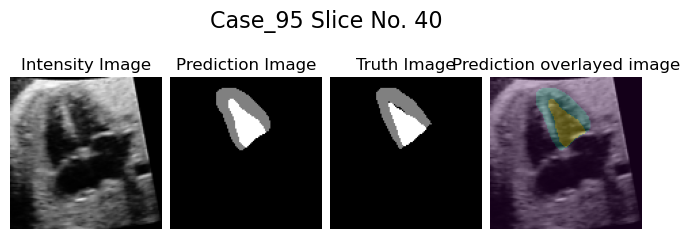

100%|██████████| 30/30 [00:04<00:00,  6.38it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


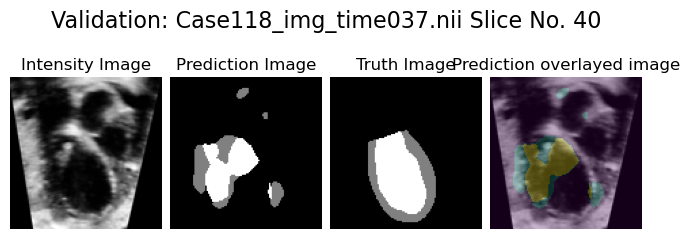

Epoch: 71 | Epoch Time: 1m 57s
	Train Loss: 0.135
	 Val. Loss: 0.915

Current Epoch: 72 / 100


100%|██████████| 186/186 [01:53<00:00,  1.64it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


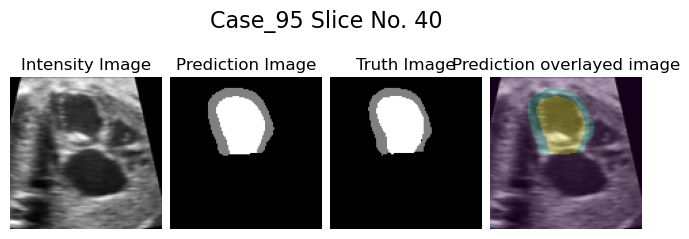

100%|██████████| 30/30 [00:04<00:00,  6.38it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


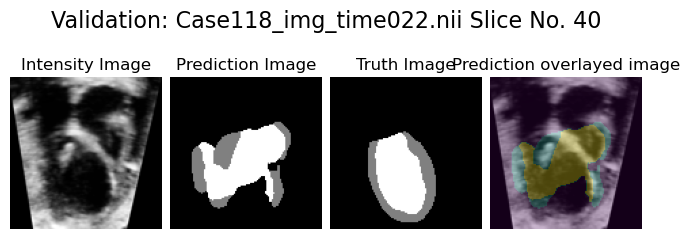

Epoch: 72 | Epoch Time: 1m 58s
	Train Loss: 0.169
	 Val. Loss: 0.893

Current Epoch: 73 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


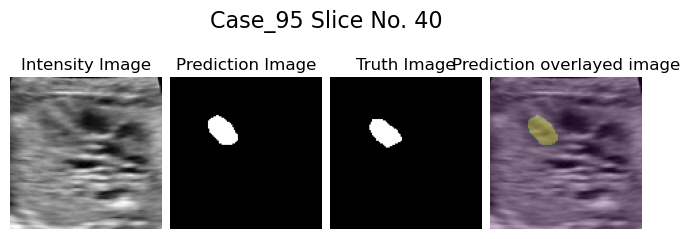

100%|██████████| 30/30 [00:04<00:00,  6.37it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


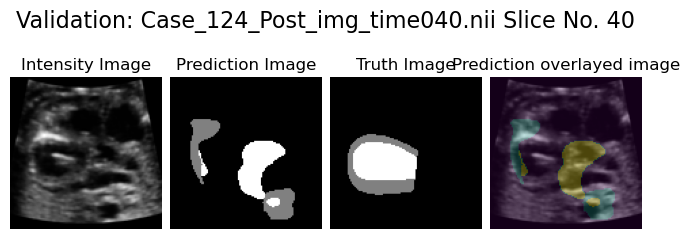

Epoch: 73 | Epoch Time: 1m 57s
	Train Loss: 0.174
	 Val. Loss: 0.925

Current Epoch: 74 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


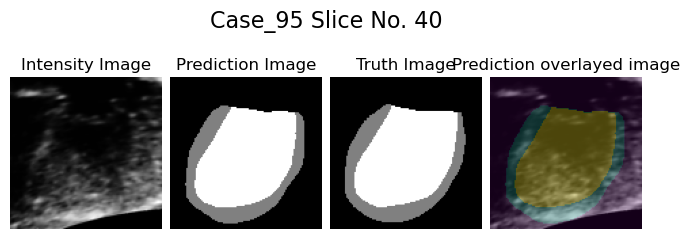

100%|██████████| 30/30 [00:04<00:00,  6.38it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


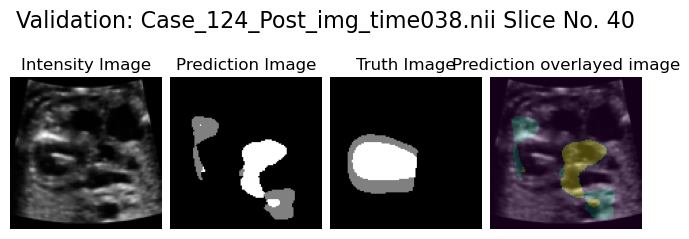

Epoch: 74 | Epoch Time: 1m 57s
	Train Loss: 0.147
	 Val. Loss: 0.894

Current Epoch: 75 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


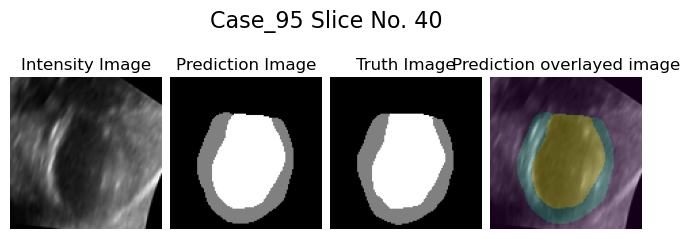

100%|██████████| 30/30 [00:04<00:00,  6.38it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


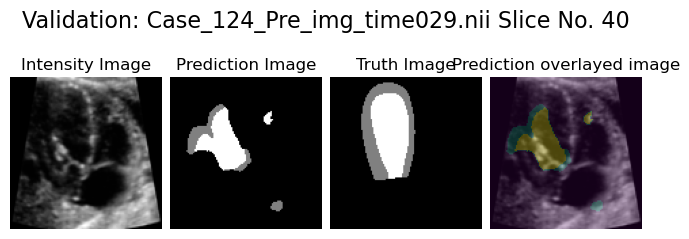

Epoch: 75 | Epoch Time: 1m 57s
	Train Loss: 0.152
	 Val. Loss: 0.920

Current Epoch: 76 / 100


100%|██████████| 186/186 [01:52<00:00,  1.65it/s]

torch.Size([3, 3, 112, 112, 112])
torch.Size([3, 1, 112, 112, 112])


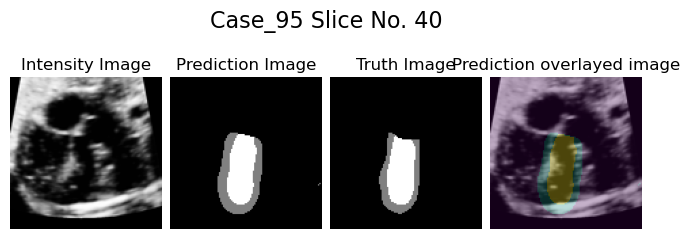

100%|██████████| 30/30 [00:04<00:00,  6.38it/s]


torch.Size([4, 3, 112, 112, 112])
torch.Size([4, 1, 112, 112, 112])


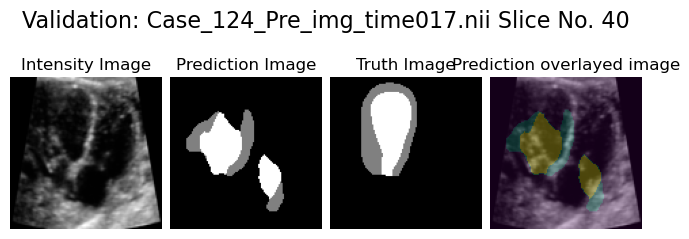

Epoch: 76 | Epoch Time: 1m 57s
	Train Loss: 0.170
	 Val. Loss: 0.895

Current Epoch: 77 / 100


 44%|████▎     | 81/186 [00:49<01:04,  1.63it/s]


KeyboardInterrupt: 

In [25]:
trainloss_ = []
validloss_ = []
myocardiumdices = []
chamberdices = []
         
for epoch in range(NUM_EPOCHS):
    print("Current Epoch:", epoch+1,"/", f"{NUM_EPOCHS}")
    start_time = time.time()
    
    train_loss = train(model, train_loader, optimizer, loss_fn, device, IMAGE_DEPTH, epoch,c)
    #Make it plot after every epoch rather than plotting every batch
    valid_loss = evaluate(model, valid_loader, loss_fn, device, IMAGE_DEPTH, epoch)
        
    # myocardiumdices += [myocardiumdice]
    # chamberdices += [chamberdice]
    
    trainloss_ += [train_loss]
    validloss_ += [valid_loss]
    scheduler.step(valid_loss)

    """Saving the model"""
    if valid_loss < best_valid_loss:
        data_str = f"Valid loss improved from {best_valid_loss:2.4f} to {valid_loss:2.4f}. Saving best checkpoint: {bestcheckpoint_path}"
        print(data_str)

        best_valid_loss = valid_loss
        torch.save(model.state_dict(), bestcheckpoint_path)
        #torch.save(model,modpath)
        
    with open(path + "/epochs.txt","w") as epochs:
    #Saving as [Num of epochs left, Total num of epochs]
        epochs.write("["+str(NUM_EPOCHS - epoch)+","+str(NUM_EPOCHS)+","+str(best_valid_loss)+"]")
    
          
    torch.save(model.state_dict(), checkpoint_path)
    
    end_time = time.time()
    epoch_mins, epoch_secs = epoch_time(start_time, end_time)
    
    data_str = f'Epoch: {epoch+1:02} | Epoch Time: {epoch_mins}m {epoch_secs}s\n'
    data_str += f'\tTrain Loss: {train_loss:.3f}\n'
    data_str += f'\t Val. Loss: {valid_loss:.3f}\n'
    print(data_str)

In [ ]:
fig, ax = plt.subplots(1,2)
ax[0].plot(trainloss_)
ax[0].title.set_text("Training Loss")
ax[1].plot(validloss_)
ax[1].title.set_text("Validation Loss")
fig.savefig(path + "/losses.png")

NameError: name 'plt' is not defined

for data in test_loader:
    x = data['train_img'].to(device, dtype=torch.float32)
    y = data['train_mask'].to(device, dtype=torch.float32)

    y = voltosl(y,40)

    intensity = x[0,:,:,:,40].cpu()
    slice = np.asarray(intensity.detach().numpy())
    slice = slice.reshape([112,112])
    intensity = slice
    fig, ax = plt.subplots(1,2, layout = 'constrained')
    ax[0].imshow(intensity)
    ax[0].set_title("Intensity Image")
    ax[1].imshow(y)
    ax[1].set_title("truth")           
    fig.suptitle(data["name"], fontsize=16, y=0.8)
    #fig.subplots_adjust(top=0)  # Adjust the top spacing to reduce the gap
    plt.show()


In [ ]:
myocardices = []
chamdices = []
for i in myocardiumdices:
    d = i.cpu().detach().numpy()
    myocardices += [d]

chamdices = []
for i in chamberdices:
    d = i.cpu().detach().numpy()
    chamdices += [d]

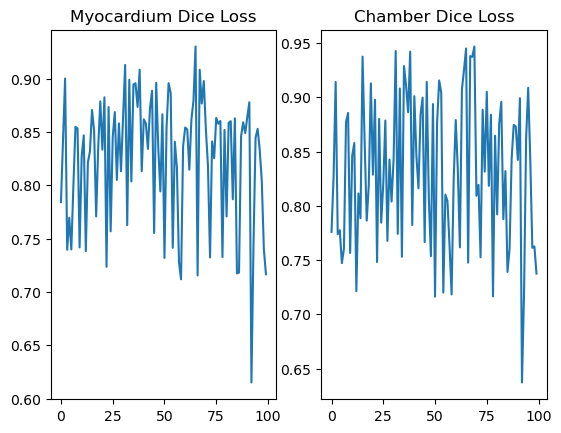

In [ ]:
#Plotting DICE
fig, ax = plt.subplots(1,2)
ax[0].plot(myocardices)
ax[0].title.set_text("Myocardium Dice Loss")
ax[1].plot(chamdices)
ax[1].title.set_text("Chamber Dice Loss")
fig.savefig(path + "/dices.png")

In [ ]:
# File path to save CSV
file_path = path + "/losses.csv"
import csv

# Write lists to CSV
with open(file_path, 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Training Loss', 'Validation Loss'])  # Writing header
    writer.writerows(zip(trainloss_, validloss_))  # Writing data

In [ ]:


#I think this first run had each epoch do 2 sets of data, need to consider changing the batches cuz that dont make sense no
#CHECK WHAT DATA GOT LOADED AFTER EACH EPOCH FOR CONSISTENCY
if __name__ == "__main__":
    test()
    pass
    # main()